# Module 3: Commercial Real Estate in the New York City
## B8474 Real Estate Analytics

## Background and Learning Goals

The background to this module is the remote work revolution and how it has affected the value of commercial real estate, in particular offices and retail in the Central Business Districts. This is the subject of a new working paper I wrote "Work From Home and the Office Real Estate Apocalypse." 



The skills we will develop in this module are:
* Observing city-level trends of commercial leasing activity (quantities) over time for various submarkets, different tenant and building types
* Observing city-level trends of rents (prices) over time for various submarkets, different tenant and building types
* Calculating fixed effects
* Studying the impact of covid on the duration of office leases and concessions offered to tenants
* Constructing a repeat-rent index
* Using a linear probability model to predict lease renewals 
* Evaluating a predictive classifier using precision, recall, and F-Score

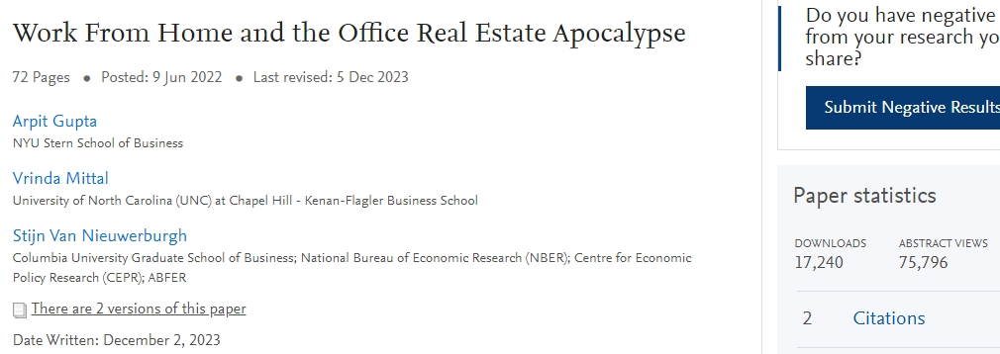

## Office Occupancy Rate in Manhattan

First, we show the contractual occupancy rate for office properties in NYC (data from Cushman & Wakefield).

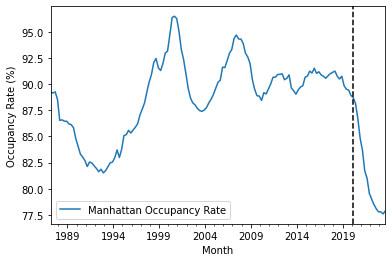

Then, we show a measure of actual physical occupancy courtesy of Kastle. Kastle uses turnstile data in thousands of office buildings in the ten largest metropolitan areas, as well as their average. Here, we load weekly NY MSA Kastle data. As of January 24th 2024, office occupancy is at 51.8% of 2019 levels on average in the 10 largest cities and at 51.3% in NYC.

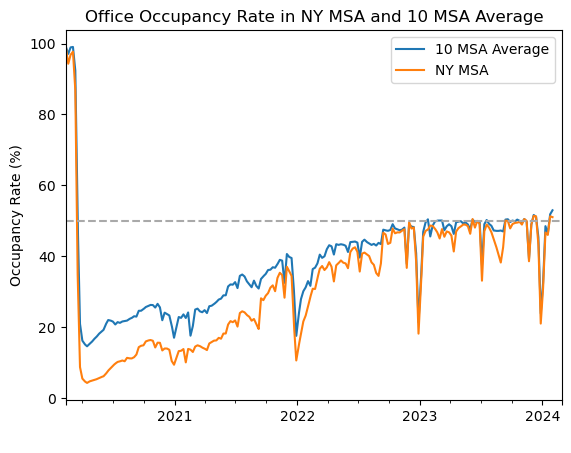

In normal market, you can refinance large buildings that have appreciated in value and take out equity. But now post covid office buildings actually have lost value. Landlord might owe in their mortgage than the building is worth. 

Theoretically, you would have to pay the difference out of your bank account. But with limited liability, you can just walk away and give the property back to the bank. Each building is typically its own LLC in commercial real estate. So you can leave the bank holding the bag, bank writes off the bad debt. So potentially mass real estate foreclosures could be a risk to the banking sector. 

Banks are largest holder of real estate mortgages (50%), insurance is 15%, and commercial mortgage backed securities (15%).  

In [8]:
import sys, os

# Add the "Code" directory to the path, so we can load our modules
module_path = os.path.abspath(os.path.join("..", ".."))  
if module_path not in sys.path:
    sys.path.append(module_path)

# Load user defined libraries
from Code.settings import *
import Code.Util as util
from IPython.display import Markdown, display

pd.set_option('display.max_columns', 60)    # Make sure we can see all of the columns
pd.options.mode.chained_assignment = None   # mute chained assignment warnings to avoid cluttering the notebook

def printmd(string):
    display(Markdown(string))

SAVE_FOR_HW = False  # You don't need to save df for the homework
# SAVE_FOR_HW = True 

# 0. Load NYC Compstak data. 

[Compstak](https://www.compstak.com/) covers 105 office markets in the U.S., but we will only use NYC data for this exercise.

The data has been cleaned and stored as a pickle for you.

Refer to the functions get_full_df()  and clean_ll_data() on the various procedures that were used to remove ambiguous observations, fill missing values, etc. We will go over some of this during the tutorial. You are not expected to fully understand how every field was cleaned, but a knowledge of data cleaning procedures is generally a useful skill to have. 



Net effective rent = actual rent you pay on average, deducting free months, discounts, concessions to tenant (which can be money to upgrade space)

In [9]:
# Read the pre-processed data
data = pd.read_pickle(data_path +'/nyc_data_20231231.pkl')
data = data[data['transaction_year'] >= 2000]

# subset to get last 10Y and last 5Y data
data_10Y = data[data['transaction_year'] >= data['transaction_year'].max() - 10]
data_5Y = data[data['transaction_year'] >= data['transaction_year'].max() - 5]

In [10]:
data.shape

(32947, 40)

In [11]:
# Display the first 10 rows of the data
# We have converted the dates to the end of each month, so that we can easily analyze the data on the monthly level
data = data.sort_values(by='execution_date_monthend')
data.tail(10)
# the last leases included were signed in November 2023

,Transaction Quarter,transaction_year,execution_date_monthend,Expiration_date_monthend,commencement_date_monthend,Submarket_Filled,Tenant Industry,Tenant Industry filled,Building Class,Transaction Type filled,Building Class Enhanced,Transaction Type,Transaction SQFT,Ones,Dollar_val_annualized,Starting Rent (USD) (per year),Net Effective Rent (USD) (per year),Net Effective Rent deflated (USD) (per year),Lease Term,Lease Term Bucket,Lease Type,lease_size,building_size,teleworkable_emp3,Work Value (USD),effective_to_starting,perc_free,monthly_rent_schedule,lease_code,Floors Occupied,Employee_size,Rent Schedule (USD),Rent_value_type,Year Renovated,Age Building,Year Built,Building Size,City,Tenant Code,Building Code
189965,2023 - Q4,2023,2023-11-30,2036-03-31,2024-03-31,TS + Penn Station + Chelsea,Apparel/Retail,Apparel/Retail,B,Renewal,B + C,Renewal,28000,1,1.899170e+06,59.0,67.827499,NaN,144.0,10Yrs+,NaN,Q4,Q3,0.535482,0.0,1.149619,0.000000,"[59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59....",NY_2023_Q4_195374,"[10, 12]",Q3,"59.00/1y, 60.48/1y, 61.99/1y, 63.54/1y, 65.12/...",Unknown,NaN,104.0,1919,174000.0,New York,007941,00721
189964,2023 - Q4,2023,2023-11-30,2035-06-30,2024-03-31,Grand Central,Media,Media,A,New Lease,A,New Lease,14206,1,7.134566e+05,54.0,50.222198,NaN,135.0,10Yrs+,NaN,Q4,Q4,0.802697,0.0,0.930041,0.111111,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NY_2023_Q4_195373,26,Q3,"54.00/6y3m, 59.00/5y",Unknown,2007.0,67.0,1956,941897.0,New York,021391,01685
189963,2023 - Q4,2023,2023-11-30,2040-11-30,2023-12-31,Gramercy Park Union Square + Murray Hill,Legal Services,Legal Services,B,New Lease,B + C,New Lease,132000,1,8.760404e+06,83.5,66.366699,NaN,204.0,10Yrs+,NaN,Q4,Q4,0.802697,195.0,0.794811,0.117647,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NY_2023_Q4_195372,"[8, 9]",Q3,"83.50/5y, 90.50/5y, 97.50/5y",Unknown,NaN,98.0,1925,703786.0,New York,021030,01902
189957,2023 - Q4,2023,2023-11-30,2027-06-30,2024-03-31,TS + Penn Station + Chelsea,Materials,Materials,A,Renewal,A,Renewal,6523,1,5.419106e+05,90.0,83.076897,NaN,39.0,3-5Yrs,NaN,Q3,Q4,0.151347,0.0,0.923077,0.076923,"[0.0, 0.0, 0.0, 90.0, 90.0, 90.0, 90.0, 90.0, ...",NY_2023_Q4_195366,1,Q1,NaN,Unknown,2019.0,51.0,1972,2656000.0,New York,003134,02228
189954,2023 - Q4,2023,2023-11-30,2034-03-31,2024-03-31,Madison/Fifth/Sixth Avenue,Financial Services,Financial Services,A,New Lease,A,New Lease,17000,1,1.275000e+06,80.0,75.000000,NaN,120.0,5-10Yrs,NaN,Q4,Q4,0.583999,0.0,0.937500,0.100000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NY_2023_Q4_195363,23,Q1,"80.00/5y, 86.00/5y",Unknown,2018.0,54.0,1969,1896140.0,New York,003072,01853
189951,2023 - Q4,2023,2023-11-30,2033-03-31,2024-03-31,Madison/Fifth/Sixth Avenue,Financial Services,Financial Services,A,Renewal,A,Renewal,5455,1,3.420487e+05,71.0,62.703701,NaN,108.0,5-10Yrs,NaN,Q3,Q4,0.954432,0.0,0.883151,0.148148,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NY_2023_Q4_195360,31,NaN,"71.00/5y, 76.00/4y",Unknown,2013.0,92.0,1931,475000.0,New York,008473,01139
189932,2023 - Q4,2023,2023-11-30,2033-10-31,2023-11-30,FiDi + City Hall + WTC,Financial Services,Financial Services,B,New Lease,B + C,New Lease,41878,1,1.790284e+06,46.0,42.750000,NaN,120.0,5-10Yrs,NaN,Q4,Q4,0.583999,50.0,0.929348,0.125000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NY_2023_Q4_195341,27,Q3,"46.00/5y, 51.00/5y",Unknown,2016.0,107.0,1916,1052861.0,New York,016442,00073
189931,2023 - Q4,2023,2023-11-30,2035-11-30,2023-11-30,Columbus Circle,Legal Services,Legal Services,A,NaN,A,NaN,12022,1,8.655840e+05,72.0,72.000000,NaN,144.0,10Yrs+,NaN,Q4,Q4,0.802697,0.0,1.000000,0.000000,"[72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72....",NY_2023_Q4_195340,35,Q3,NaN,Unknown,NaN,34.0,1989,800000.0,New York,010413,00335
189966,2023 - Q4,2023,2023-11-30,2024-09-30,2024-03-31,Gramercy Park Union Square + Murray Hill,Legal Services,Legal Services,A,Renewal,A,Renewal,159562,1,1.388189e+07,87.0,87.000000,NaN,6.0,0-3Yrs,NaN,Q4,Q4,0.802697,0.0

Buildings are ranked into class A, B, C. Uris hall on the Columbia Campus (old b-school) is a class C. A is broad category (75% of Manhattan office buildings). Within A, there is a broad range. A+ is the highest quality trophy buildings

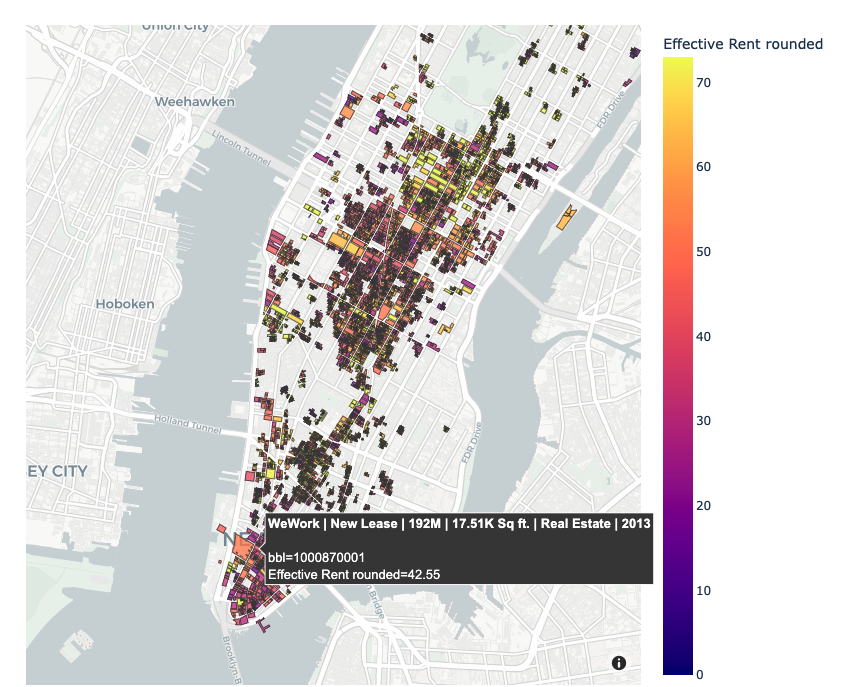

# Section 1. Leasing Data Summary Statistics

## 1.1 Leasing Volume

### 1.1.1 Overall Leasing Volume

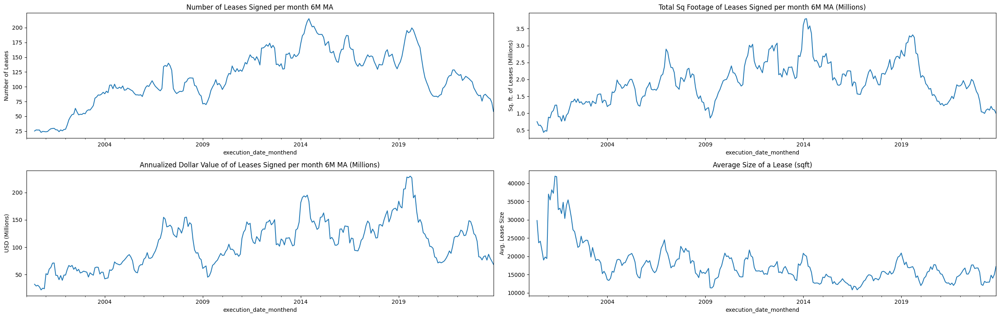

In [12]:
# Calculate the total number, the total square footage, and the total dollar value of leases signed each month.
# We sum over the column of 1s to get the number of leases. An alternative way is to use groupby().count()
# the dollar value of a lease is the transaction sqft times the net effective rent
volume = data.groupby('execution_date_monthend')[['Ones', 'Transaction SQFT', 'Dollar_val_annualized']].sum()

# Initialize the 2*2 plot
fig, ax = plt.subplots(2,2, figsize = (25, 8), tight_layout = True)  # tight_layout = True makes sure the plots don't overlap
 
# series.rolling(6).mean() calculates the 6 month moving average. We will use this extensively.
volume['Ones'].rolling(6).mean().plot(ax = ax[0,0], title = 'Number of Leases Signed per month 6M MA')  # ax = ax[0,0] means we plot in the first row, first column
(volume['Transaction SQFT'].rolling(6).mean() / 1e6).plot(ax = ax[0,1], title = 'Total Sq Footage of Leases Signed per month 6M MA (Millions)') 
(volume['Dollar_val_annualized'].rolling(6).mean() / 1e6).plot(ax = ax[1,0], title = 'Annualized Dollar Value of of Leases Signed per month 6M MA (Millions)')
(volume['Transaction SQFT'].rolling(6).mean() / volume['Ones'].rolling(6).mean()).plot(ax = ax[1,1], title = 'Average Size of a Lease (sqft)')


ax[0,0].set_ylabel('Number of Leases')
ax[0,1].set_ylabel('Sq. ft. of Leases (Millions)')
ax[1,0].set_ylabel('USD (Millions)')
ax[1,1].set_ylabel('Avg. Lease Size')

#ax[1,1].set_visible(False) # We don't need the 4th plot, so we make it invisible

plt.show()

One thing to note is that the data for early 2000s is quite incomplete, only has data for the biggest leases. 

### 1.1.2 Leasing Volume by Submarkets

NYC has many submarkets. We have combined nearby areas to reduce the clutter in the plots.

We will utilize the **pandas pivot function!** It could transform a panel data (long table) into a collection of times series (wide table). 

See the example below: 

In [13]:
volume_submarkets_temporary = data.groupby(['execution_date_monthend', 'Submarket_Filled'])[['Transaction SQFT']].sum().reset_index()

# dataframe before transformation:
volume_submarkets_temporary

,execution_date_monthend,Submarket_Filled,Transaction SQFT
0,2000-01-31,Columbus Circle,12595
1,2000-01-31,FiDi + City Hall + WTC,506329
2,2000-01-31,Gramercy Park Union Square + Murray Hill,142936
3,2000-01-31,Grand Central,57508
4,2000-01-31,Madison/Fifth/Sixth Avenue,65303
...,...,...,...
2421,2023-11-30,FiDi + City Hall + WTC,41878
2422,2023-11-30,Gramercy Park Union Square + Murray Hill,300552
2423,2023-11-30,Grand Central,29089
2424,2023-11-30,Madison/Fifth/Sixth Avenue,22455


In [14]:
# We now use .pivot() to create a pivot table
# columns = 'Submarket_Filled' means we will have a column for each submarket
# index = 'execution_date_monthend' means we will have a row for each month
# values = 'Transaction SQFT' means we will keep the sqft values in the table
volume_submarkets_temporary2 = volume_submarkets_temporary.pivot(columns = 'Submarket_Filled', index = 'execution_date_monthend', values = 'Transaction SQFT')

# dataframe after transformation:
volume_submarkets_temporary2

Submarket_Filled,Columbus Circle,FiDi + City Hall + WTC,Gramercy Park Union Square + Murray Hill,Grand Central,Madison/Fifth/Sixth Avenue,NoHo + SoHo + Hudson Square,Other,Park Avenue + Midtown Eastside,TS + Penn Station + Chelsea
execution_date_monthend,,,,,,,,,
2000-01-31,12595.0,506329.0,142936.0,57508.0,65303.0,104373.0,NaN,198768.0,453892.0
2000-02-29,10995.0,NaN,100000.0,NaN,3183.0,30000.0,NaN,4400.0,NaN
2000-03-31,23621.0,139924.0,252000.0,7420.0,NaN,NaN,15062.0,99254.0,NaN
2000-04-30,7255.0,477213.0,131213.0,645996.0,66051.0,160754.0,2300.0,251822.0,343767.0
2000-05-31,NaN,NaN,NaN,NaN,NaN,1200.0,NaN,3532.0,NaN
...,...,...,...,...,...,...,...,...,...
2023-07-31,5970.0,105004.0,83476.0,120746.0,157212.0,131484.0,86908.0,136752.0,244725.0
2023-08-31,14905.0,78435.0,61646.0,89859.0,111184.0,46555.0,14391.0,847448.0,179741.0
2023-09-30,19584.0,88297.0,155718.0,81969.0,223934.0,36062.0,39700.0,113438.0,115227.0


In [15]:
def plot_volume(data, grouper, major, plot_title, start_date = None):
    """
    grouper: string; column by which you want to groupby
    major: list; subset list that you want to display, say you want to display only some of the industries, or only some of the cities
    plot_title: string; title of the plot
    """

    if start_date is not None:
        data = data[data['execution_date_monthend']>= start_date]
       
    volume_by = data.groupby(['execution_date_monthend', grouper])[['Ones', 'Transaction SQFT', 'Dollar_val_annualized']].sum().reset_index()

    # Use .pivot() to transform the dataframe, .rolling() to calculate a moving average, and then plot
    volume_by_counts = volume_by.pivot(index = 'execution_date_monthend', columns = grouper, values = 'Ones')
    volume_by_counts.rolling(6).mean().plot(figsize = (25, 8), title = 'Number of Leases Signed per month (6M MA) by {}'.format(plot_title))
    plt.ylabel('Number of Leases')
    plt.show()

    volume_by_sqft = volume_by.pivot(index = 'execution_date_monthend', columns = grouper, values = 'Transaction SQFT')
    (volume_by_sqft.rolling(6).mean()/1e6).plot(figsize = (25, 8), title = 'Million Sqft of Leases Signed per month (6M MA) by {}'.format(plot_title))
    plt.ylabel('Sq. Ft. (Millions)')
    plt.show()

    volume_by_val = volume_by.pivot(index = 'execution_date_monthend', columns = grouper, values = 'Dollar_val_annualized')
    (volume_by_val.rolling(6).mean()/1e6).plot(figsize = (25, 8), title = 'Million Dollars of Annual Lease Value per month (6M MA) by {}'.format(plot_title))
    plt.ylabel('USD (Millions)')
    plt.show()   


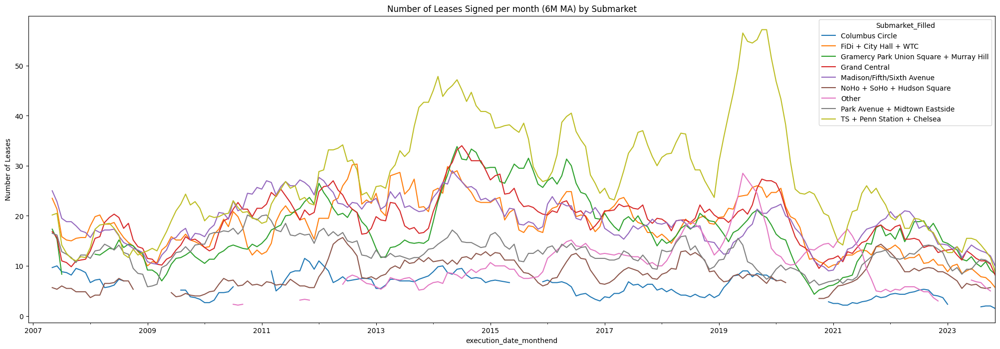

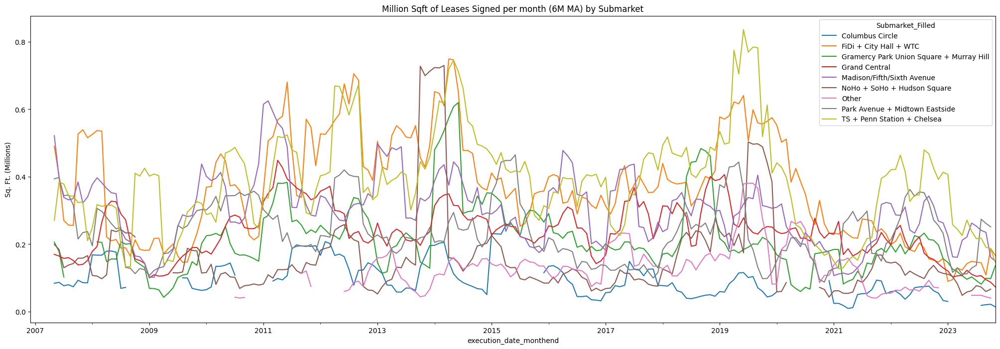

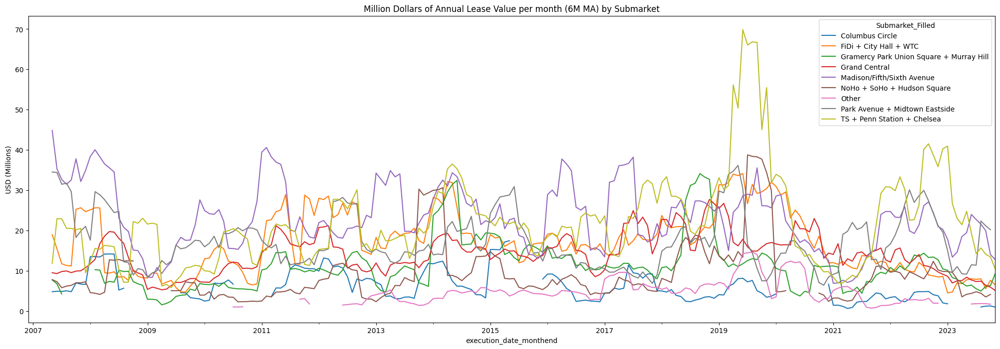

In [16]:
# We now utilize this pivot function to plot the sqft of leases signed in each submarket
# Remove volumes of North Manhattan and Other due to insufficient data
plot_volume(data,'Submarket_Filled',list(set(data['Submarket_Filled']) - {'North Manhattan', 'Other'}), 'Submarket',start_date=pd.to_datetime('2006-12-31') )    

Manhattan office market is 450 million sq total. 

### 1.1.3 Leasing Volume by Industry

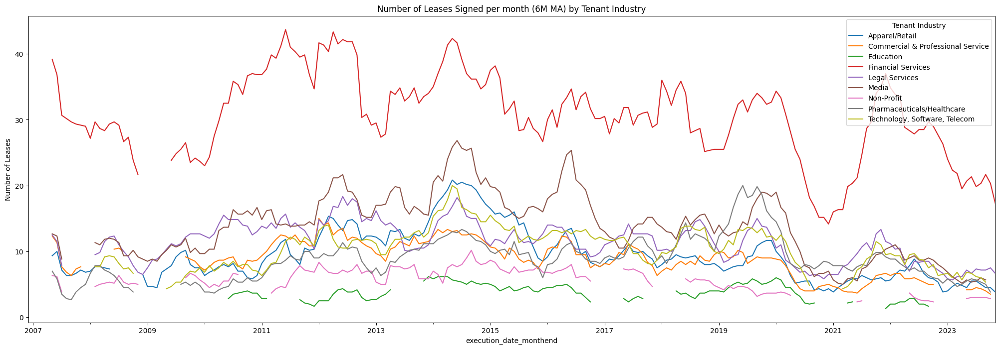

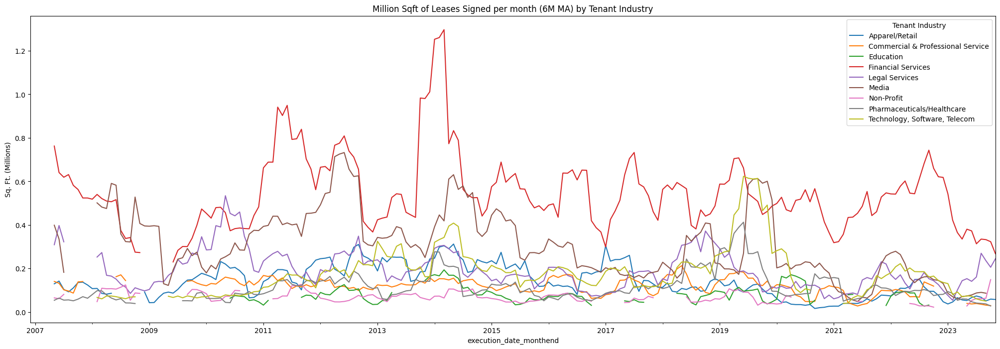

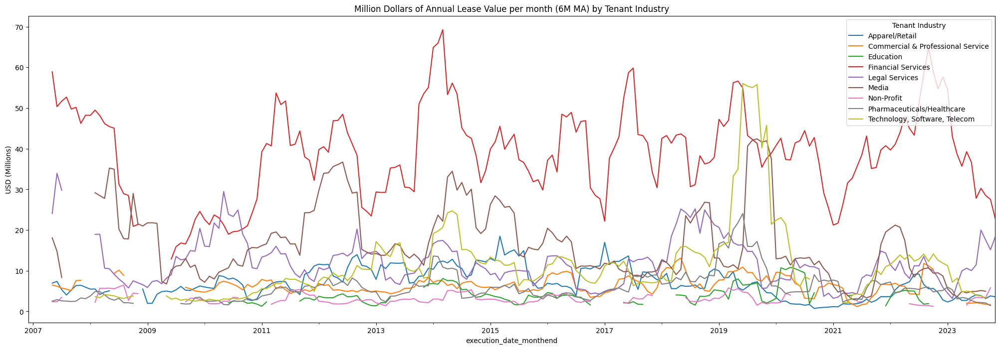

In [17]:
# Plot the same lease signing statistics by major tenant (.py file with major industries, to reduce clutter)
filtered_data = data[data['Tenant Industry'].isin(major_industries)]
plot_volume(filtered_data,'Tenant Industry',None, 'Tenant Industry',start_date=pd.to_datetime('2006-12-31') )    

### 1.1.4 Leasing Volume by Building Class

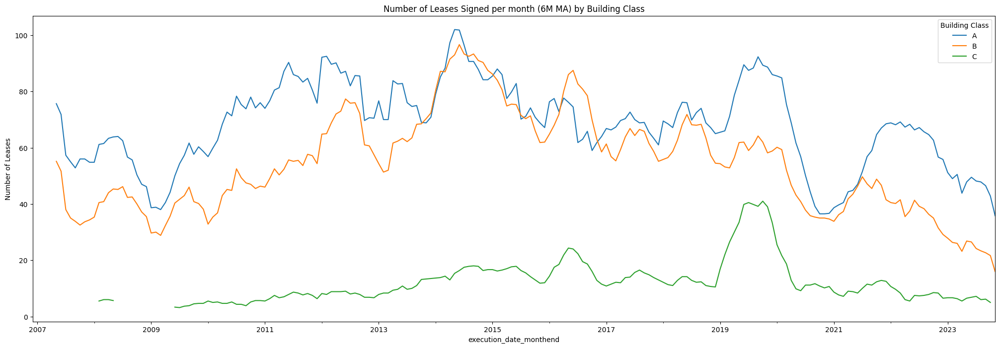

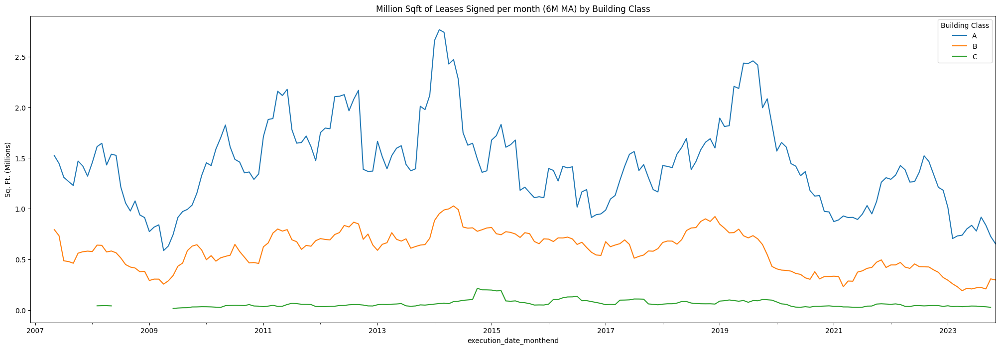

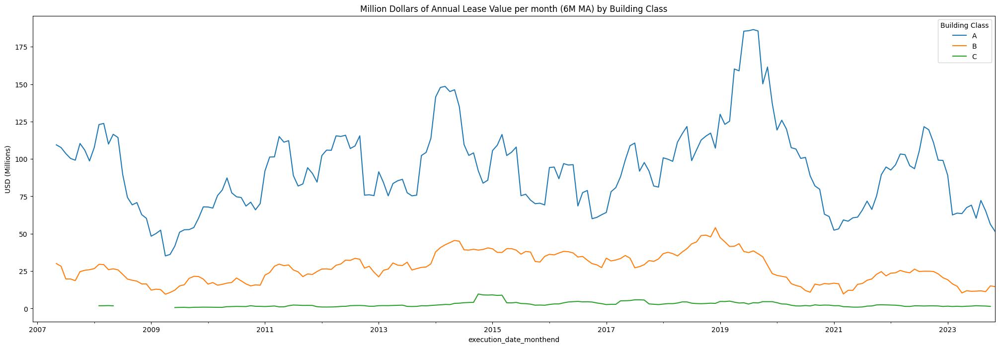

In [18]:
# Plot the same lease signing statistics by building class
plot_volume(data,'Building Class',None, 'Building Class',start_date=pd.to_datetime('2006-12-31') )  

### 1.1.5 Leasing Volume by Transaction Type

Next, we look at leases broken down by type: new leases, expansions (tenant takes more space), extensions (tenant lengthens the duration of the lease), renewals (tenant renews for the same amount of space).

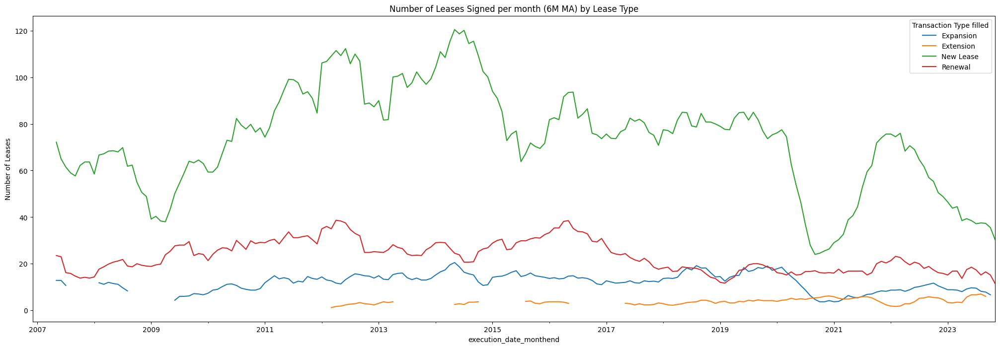

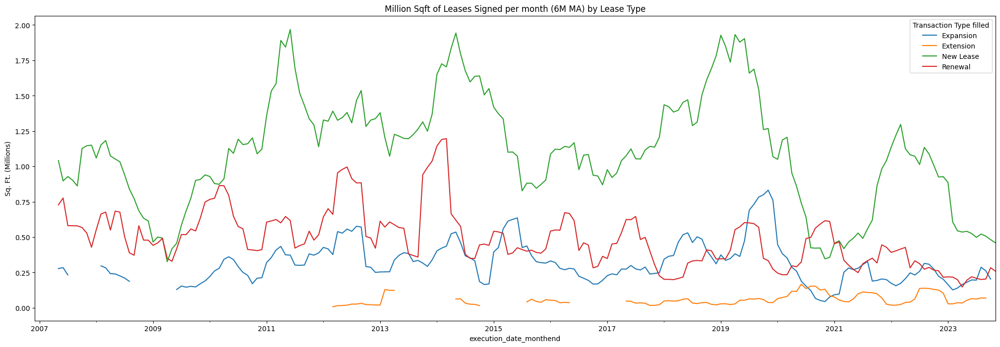

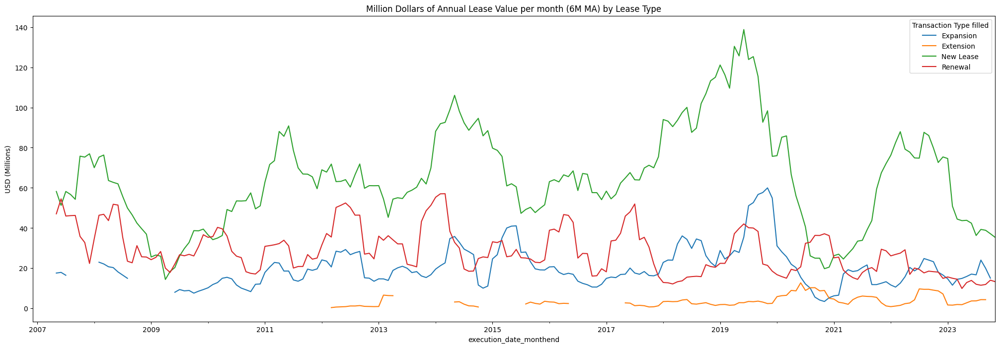

In [19]:
# Plot the same lease signing statistics by building class
filtered_data = data[data['Transaction Type filled'] != 'Other']
plot_volume(filtered_data,'Transaction Type filled',None, 'Lease Type',start_date=pd.to_datetime('2006-12-31') )  

Expansion = more space

extension = more time

Prof thinks new leases might be a little over counted


## 1.2 Net Effective Rents

The net effective rent is the per-period equivalent rent on a long-term lease. It takes into account that there may be a period of free rent (concession) as well as tenant improvements (TI, work done to make the space fit the needs of the tenant, paid for by the landlord). The Net Effective Rent is the rent that the landlord actually earns after concessions and TI are accounted for.

## 1.2.1 Net Effective Rents by Submarket, Industry and Building Class

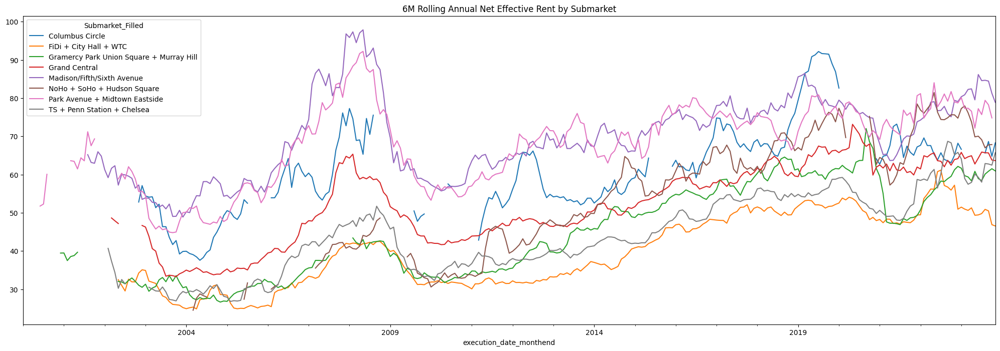

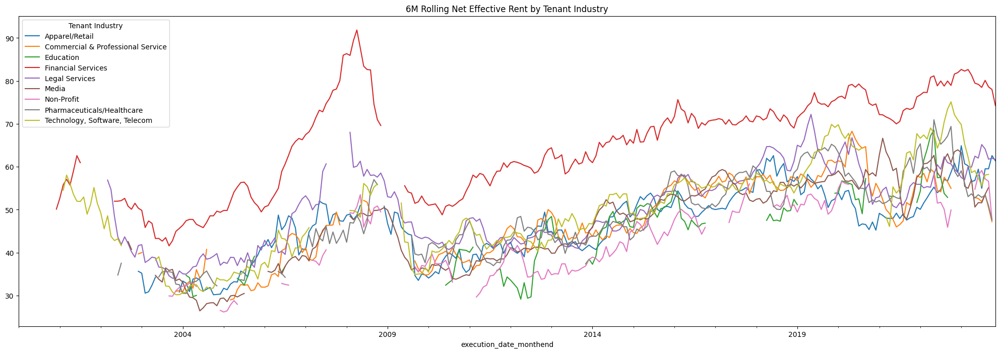

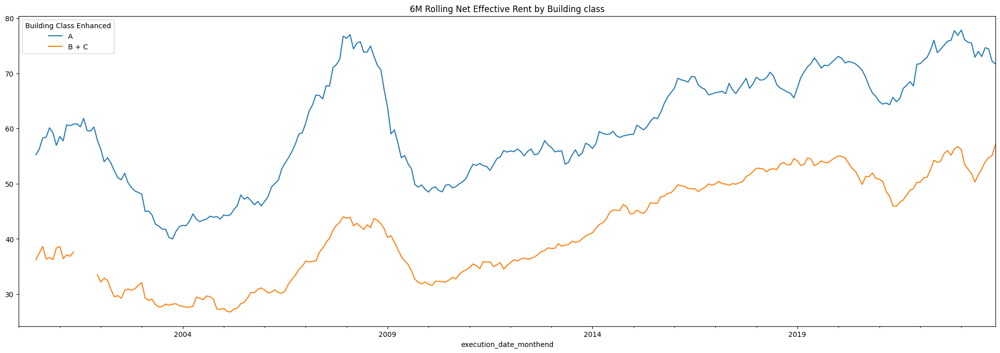

In [20]:
# average net effective rent (NER) by submarket
effective_rent_submarket = data.groupby(['execution_date_monthend', 'Submarket_Filled'])[['Net Effective Rent (USD) (per year)']].mean().reset_index()
effective_rent_submarket = effective_rent_submarket[~effective_rent_submarket['Submarket_Filled'].isin(['North Manhattan', 'Other'])] # remove small submarkets
effective_rent_submarket = effective_rent_submarket.pivot(index = 'execution_date_monthend', columns = 'Submarket_Filled', values = 'Net Effective Rent (USD) (per year)')
effective_rent_submarket.rolling(6).mean().plot(figsize = (25, 8), title = '6M Rolling Annual Net Effective Rent by Submarket')
plt.show()

# average NER by major tenant industry 
effective_rent_industries = data.groupby(['execution_date_monthend', 'Tenant Industry'])[['Net Effective Rent (USD) (per year)']].mean().reset_index()
effective_rent_industries = effective_rent_industries[effective_rent_industries['Tenant Industry'].isin(major_industries)] 
effective_rent_industries = effective_rent_industries.pivot(index = 'execution_date_monthend', columns = 'Tenant Industry', values = 'Net Effective Rent (USD) (per year)')
effective_rent_industries.rolling(6).mean().plot(figsize = (25, 8), title = '6M Rolling Net Effective Rent by Tenant Industry')
plt.show()

# Here we use the Building Class Enhanced column, which combines B & C classes into one category
effective_rent_buildingclass = data.groupby(['execution_date_monthend', 'Building Class Enhanced'])[['Net Effective Rent (USD) (per year)']].mean().reset_index()
effective_rent_buildingclass = effective_rent_buildingclass.pivot(index = 'execution_date_monthend', columns = 'Building Class Enhanced', values = 'Net Effective Rent (USD) (per year)')
effective_rent_buildingclass.rolling(6).mean().plot(figsize = (25, 8), title = '6M Rolling Net Effective Rent by Building class')
plt.show()

### 1.2.2 Growth Rate of Net Effective Rents

In [21]:
# Define a function to plot the growth rates of rents by different categories
def plot_growth_rents(data, grouper, major, plot_title, start_date = None):
    """
    grouper: string; column by which you want to groupby
    major: list; subset list that you want to display, say you want to display only some of the industries, or only some of the cities
    plot_title: string; title of the plot
    """

    if start_date is not None:
        data = data[data['execution_date_monthend'].dt.date >= start_date]
    # get the average rent for each quarter
    growth_rents = data.groupby([grouper, 'Transaction Quarter'])['Net Effective Rent (USD) (per year)'].mean().reset_index()
    if major is not None:
        growth_rents = growth_rents[growth_rents[grouper].isin(major)]
            
    growth_rents = growth_rents.dropna()
    # Remember to sort the data by the grouper and the transaction quarter before shifting!
    growth_rents = growth_rents.sort_values(by = [grouper, 'Transaction Quarter'])
    
    # Shifts the data forward 4 quarters to get the rent from the same quarter in the previous year
    growth_rents['rent_prev_year_same_quarter'] = growth_rents.groupby(grouper).shift(4)['Net Effective Rent (USD) (per year)']

    # Log growth rates
    growth_rents['YoY_growth'] = np.log(growth_rents['Net Effective Rent (USD) (per year)'] / growth_rents['rent_prev_year_same_quarter'])
    
    # Create pivot table for YoY growth with transaction quarter in the rows and grouper in the columns
    growth_rents_yoy = growth_rents.pivot(columns = grouper, index = 'Transaction Quarter', values = 'YoY_growth').dropna()
    
    # Multiply the rates by 100 and display them as percentages
    (growth_rents_yoy * 100).plot.bar(figsize = (25, 8), title = 'NER growth (rel. to same quarter prev year)  {}'.format(plot_title))
    plt.gca().yaxis.set_major_formatter(mticker.PercentFormatter())
    plt.show()
    

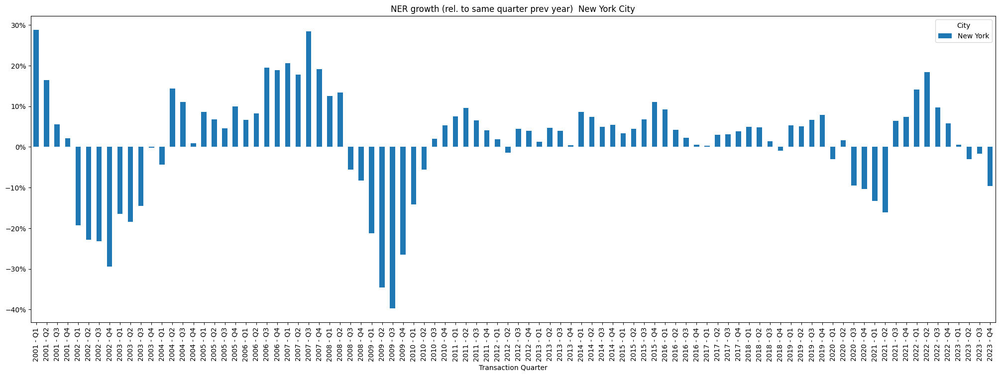

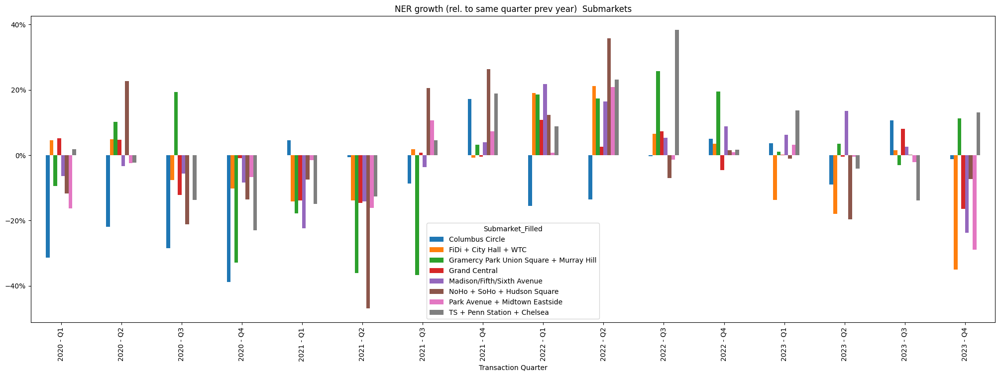

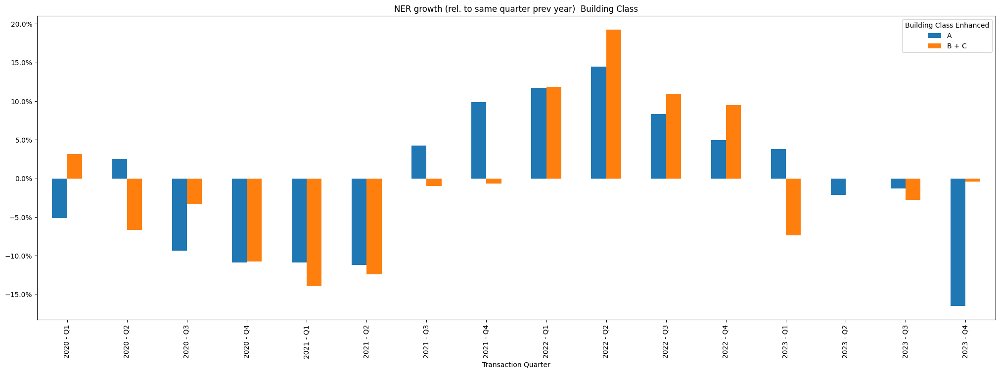

In [22]:
plot_growth_rents(data, 'City', None, 'New York City')
plot_growth_rents(data, 'Submarket_Filled', list(set(data['Submarket_Filled']) - {'North Manhattan', 'Other'}), 'Submarkets', dt.date(2019, 1, 1))
plot_growth_rents(data, 'Building Class Enhanced', None, 'Building Class', dt.date(2019, 1, 1))

### 1.2.3 Net Effective Rents and Fixed Effects

We first load CPI deflator to convert nominal net effective rents to real net effective rents.

In [23]:
# read in CPI inflation rate
inflation = util.read_inflation()
inflation = inflation[inflation['execution_date_monthend'] >= data['execution_date_monthend'].min()]

# Normalize the inflation index (make the value at the end of 2023 equal to 1)
inflation['CPIAUCSL'] = inflation['CPIAUCSL'] / inflation[inflation['execution_date_monthend'] == '2023-12-31']['CPIAUCSL'].to_list()[0]

data = pd.merge(data, inflation[['execution_date_monthend', 'CPIAUCSL']], on='execution_date_monthend', how = 'left')

# define the real NER by taking the ominal NER and dividing by the CPI (real NER is expressed in 2023 dollars)
last_year = '2023'
data['Net Effective Rent (USD) (per year) in {} Dollars'.format(last_year)] = data['Net Effective Rent (USD) (per year)'] / data['CPIAUCSL']
data['Starting Rent (USD) (per year) in {} Dollars'.format(last_year)] = data['Starting Rent (USD) (per year)'] / data['CPIAUCSL']

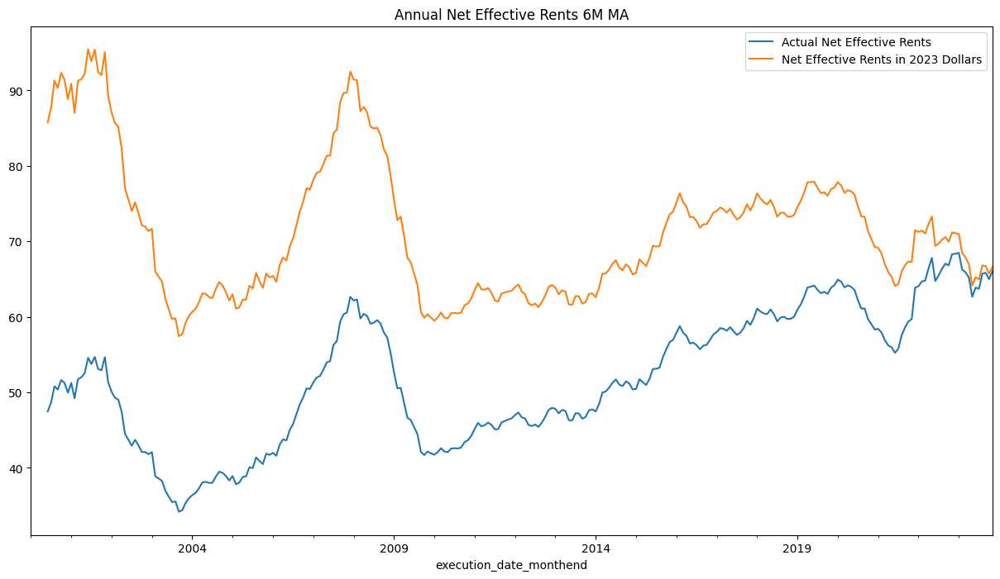

In [24]:
# Calculate the average NER by month
no_fe = data.groupby(['execution_date_monthend'])['Net Effective Rent (USD) (per year) in {} Dollars'.format(last_year)].mean()
no_fe_before_deflation = data.groupby(['execution_date_monthend'])['Net Effective Rent (USD) (per year)'].mean()

# Use rolling() to calculate a moving average and plot
# Plot1: Raw average NER before and after deflation
fig, ax = plt.subplots(figsize = (15, 8))
no_fe_before_deflation.rolling(6).mean().plot(ax = ax, title = 'Annual Net Effective Rents 6M MA', label = 'Actual Net Effective Rents')
no_fe.rolling(6).mean().plot(ax = ax, title = 'Annual Net Effective Rents 6M MA', label = 'Net Effective Rents in {} Dollars'.format(last_year))
ax.legend()
plt.show()

The raw average NER can be misleading. For example, if the high-quality, expensive buildings or submarkets are more likely to see lease signing activity during market distress, then this will push up the raw average NER, even if the true NER is falling in every area (i.e., within the high quality buildings/submarkets).

To deal with this, we can remove (for example) the submarket **fixed effects** from the NER. This will remove a submarket-specific average NER. It will keep the overall time trend in NER that is not driven by composition changes.

Next, we remove fixed effects using the package pyhdfe (py high dimensional fixed effects). We first define a function get_resids to do this.

In [25]:
def get_resids(data, value_col, fe_cols, grouper = ['execution_date_monthend']):
    """
    Uses panel data fixed effects module to extract fixed effects.
    data: pandas dataframe; leasing data
    value_col: string; column name, here effective rents
    fe_cols: list of columns wrt which you want Fixed Effects
    grouper: list of columns by which you want to cluster
    """
    # Some format cleaning 
    fe_cols = util.cList(fe_cols)
    fe_data = data[grouper + [value_col] + fe_cols].dropna()
    # Specify the columns that we use to remove fixed effects 
    market_fe = pyhdfe.create(fe_data[fe_cols].astype(str))
    # use the residualize method to get the residualized values
    fe_data[value_col] = market_fe.residualize(fe_data[[value_col]]) # THis pulls out the error term that we are interested in - the part of the rent not explained by the fixed effects. 
    # get the monthly average mean of the residualized rent of the contracts
    fe_data_raw = fe_data.groupby(grouper)[value_col].mean()
    return fe_data_raw

In [26]:
# Input of get_resids(): real NER; 
# Output of get_resids(): monthly average residualized NER
# We are computing 4 types of fixed effects: Tenant Industry, Submarket_Filled, Building Class, and Transaction Type
all_fe = get_resids(data, 'Net Effective Rent (USD) (per year) in {} Dollars'.format(last_year), ['Tenant Industry filled', 'Submarket_Filled', 'Building Class', 'Transaction Type filled'])

# Combine the NERs into a single dataframe
effective_rents = pd.concat([no_fe, all_fe], axis = 1)

fixed_effects_list = ['All FE']
effective_rents.columns = ['No FE'] + fixed_effects_list

# Add back the mean NER to the residualized NER
effective_rents = effective_rents[fixed_effects_list].add(effective_rents['No FE'].mean()).join(effective_rents['No FE'])

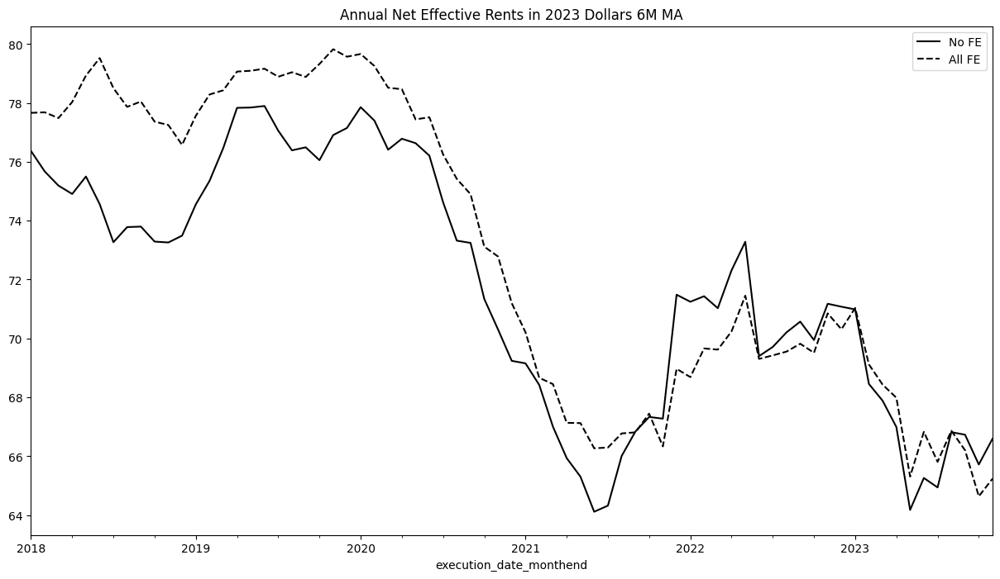

In [27]:
# Plot average NER before and after removing fixed effects
fig, ax = plt.subplots(figsize = (15, 8))
effective_rents[['No FE']].rolling(6).mean()['2018-01-31':].plot(title = 'Annual Net Effective Rents in {} Dollars 6M MA'.format(last_year), ax=ax, color='black', ls='-')
effective_rents[['All FE']].rolling(6).mean()['2018-01-31':].plot(title = 'Annual Net Effective Rents in {} Dollars 6M MA'.format(last_year), ax=ax, color='black', ls='--')
plt.show()

## 1.3 When is the Current Stock of Leases Expiring?

Since leases are long term, it is useful to understand when the existing stock of leases comes up for renewal. That helps us understand what potential pressures on rents may be in the near future.

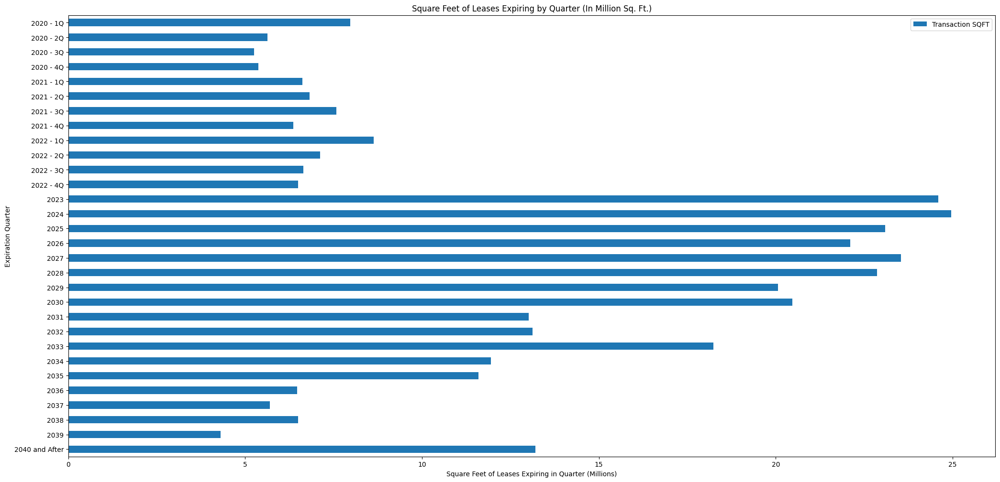

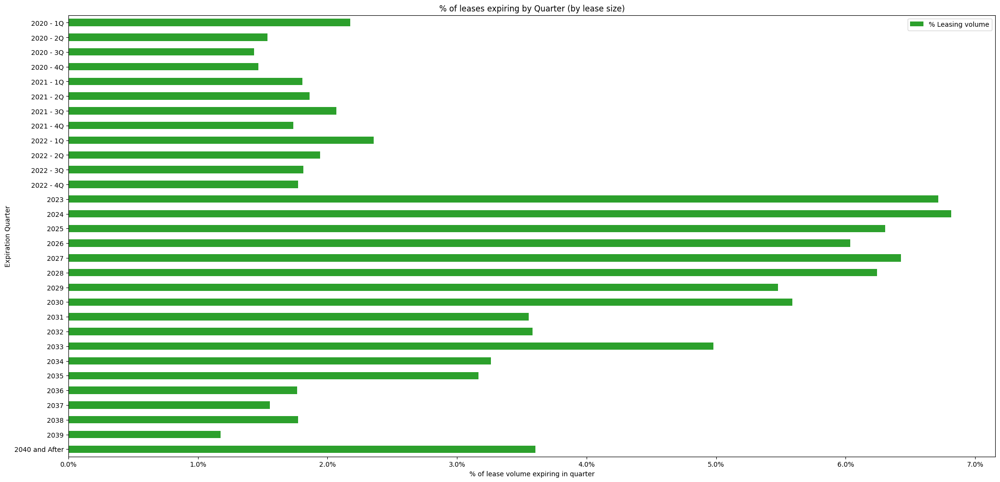

In [28]:
start_year = 2020  # starting year for the plot

# Generate expiration quarter by:
# 1. converting year to string using df[date].dt.year.astype(str)
# 2. converting quarter to string using df[date].dt.quarter.astype(str)
# 3. concatenating them
data['Expiration Quarter'] = data['Expiration_date_monthend'].dt.year.astype(str) + ' - ' + data['Expiration_date_monthend'].dt.quarter.astype(str) + 'Q'

# Get the sum of sqft of all the leases that expire in each quarter 
expiration_data = data.groupby(['Expiration Quarter'])['Transaction SQFT'].sum().reset_index()

# Modify the expiration quarter to only show by-year data after 2022
# keep data after start_year
# we apply a lambda function to the quarter series. 'x' here is the quarter
expiration_data = expiration_data[expiration_data['Expiration Quarter'].apply(lambda x: int(x[:4])) >= start_year]
# for the next 3 years, plot quarterly data, else plot annual
expiration_data['Expiration Quarter'] = expiration_data['Expiration Quarter'].apply(lambda x: x if int(x[:4]) < start_year + 3 else x[:4])
# combine all square footage expiring after 2040 into one group
expiration_data['Expiration Quarter'] = expiration_data['Expiration Quarter'].apply(lambda x: x if int(x[:4]) < start_year + 20 else '{} and After'.format(start_year + 20))
# Groupby again on the modified expiration quarter
expiration_data = expiration_data.groupby(['Expiration Quarter'])['Transaction SQFT'].sum().reset_index()

expiration_data['Transaction SQFT'] = expiration_data['Transaction SQFT'] / 1e6
expiration_data = expiration_data.sort_values(by = 'Expiration Quarter', ascending = False)

# horizontal bar chart (barh plot)
expiration_data_plot = expiration_data.set_index('Expiration Quarter')
expiration_data_plot.plot.barh(stacked = True, figsize = (25, 12), title = 'Square Feet of Leases Expiring by Quarter (In Million Sq. Ft.)')
plt.xlabel('Square Feet of Leases Expiring in Quarter (Millions)')
plt.show()

# plot % of square footage expiring.
expiration_data['% Leasing volume'] = expiration_data['Transaction SQFT'] * 100 / expiration_data['Transaction SQFT'].sum()
expiration_data = expiration_data.drop(columns = 'Transaction SQFT')
expiration_data_plot = expiration_data.set_index('Expiration Quarter')
expiration_data_plot.plot.barh(stacked = True, figsize = (25, 12), title = '% of leases expiring by Quarter (by lease size)', color = 'tab:Green')
plt.xlabel('% of lease volume expiring in quarter')
plt.gca().xaxis.set_major_formatter(mticker.PercentFormatter())
plt.show()

#### $\color{red}{\text{Think-Pair-Share Task 1}}$ 

Plot the lease expiration schedules for the leases that were outstanding on January 1st 2023?

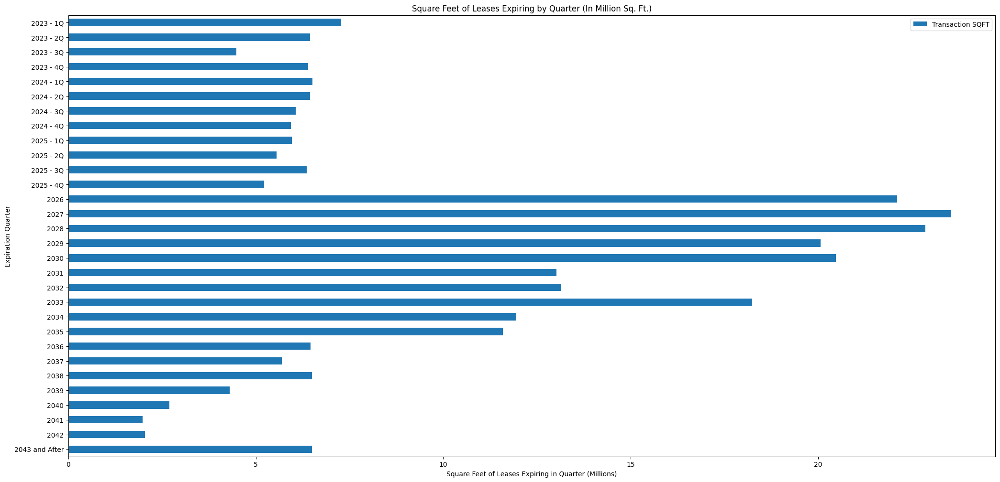

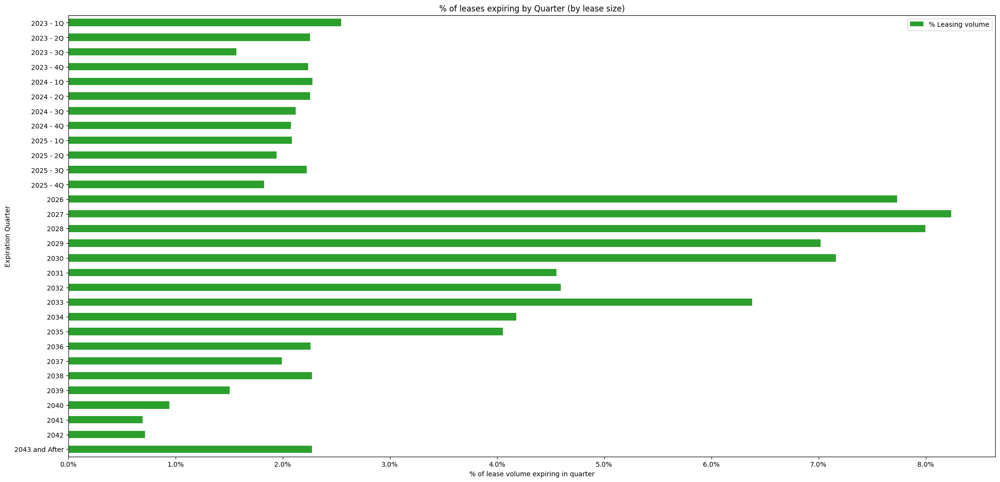

In [29]:
start_year = 2023  # starting year for the plot

# Generate expiration quarter by:
# 1. converting year to string using df[date].dt.year.astype(str)
# 2. converting quarter to string using df[date].dt.quarter.astype(str)
# 3. concatenating them
data['Expiration Quarter'] = data['Expiration_date_monthend'].dt.year.astype(str) + ' - ' + data['Expiration_date_monthend'].dt.quarter.astype(str) + 'Q'

# Get the sum of sqft of all the leases that expire in each quarter 
expiration_data = data.groupby(['Expiration Quarter'])['Transaction SQFT'].sum().reset_index()

# Modify the expiration quarter to only show by-year data after 2022
# keep data after start_year
# we apply a lambda function to the quarter series. 'x' here is the quarter
expiration_data = expiration_data[expiration_data['Expiration Quarter'].apply(lambda x: int(x[:4])) >= start_year]
# for the next 3 years, plot quarterly data, else plot annual
expiration_data['Expiration Quarter'] = expiration_data['Expiration Quarter'].apply(lambda x: x if int(x[:4]) < start_year + 3 else x[:4])
# combine all square footage expiring after 2040 into one group
expiration_data['Expiration Quarter'] = expiration_data['Expiration Quarter'].apply(lambda x: x if int(x[:4]) < start_year + 20 else '{} and After'.format(start_year + 20))
# Groupby again on the modified expiration quarter
expiration_data = expiration_data.groupby(['Expiration Quarter'])['Transaction SQFT'].sum().reset_index()

expiration_data['Transaction SQFT'] = expiration_data['Transaction SQFT'] / 1e6
expiration_data = expiration_data.sort_values(by = 'Expiration Quarter', ascending = False)

# horizontal bar chart (barh plot)
expiration_data_plot = expiration_data.set_index('Expiration Quarter')
expiration_data_plot.plot.barh(stacked = True, figsize = (25, 12), title = 'Square Feet of Leases Expiring by Quarter (In Million Sq. Ft.)')
plt.xlabel('Square Feet of Leases Expiring in Quarter (Millions)')
plt.show()

# plot % of square footage expiring.
expiration_data['% Leasing volume'] = expiration_data['Transaction SQFT'] * 100 / expiration_data['Transaction SQFT'].sum()
expiration_data = expiration_data.drop(columns = 'Transaction SQFT')
expiration_data_plot = expiration_data.set_index('Expiration Quarter')
expiration_data_plot.plot.barh(stacked = True, figsize = (25, 12), title = '% of leases expiring by Quarter (by lease size)', color = 'tab:Green')
plt.xlabel('% of lease volume expiring in quarter')
plt.gca().xaxis.set_major_formatter(mticker.PercentFormatter())
plt.show()

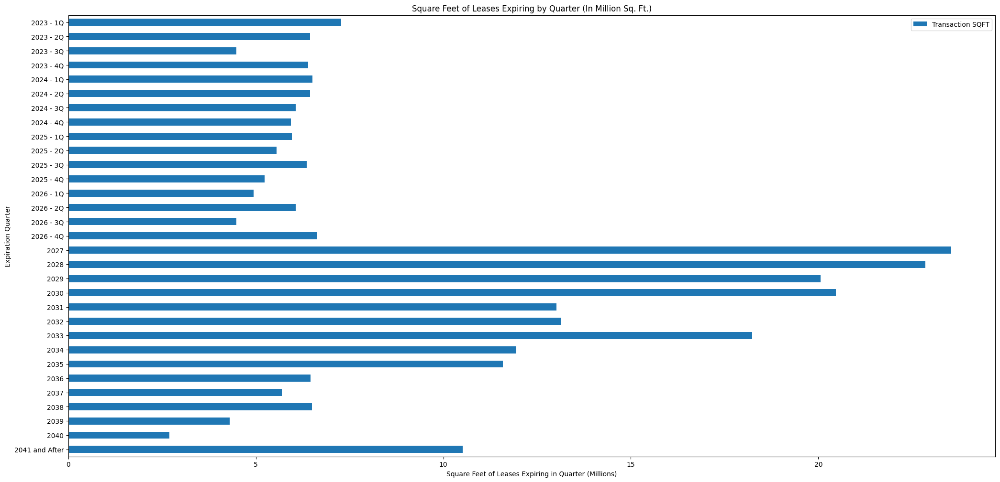

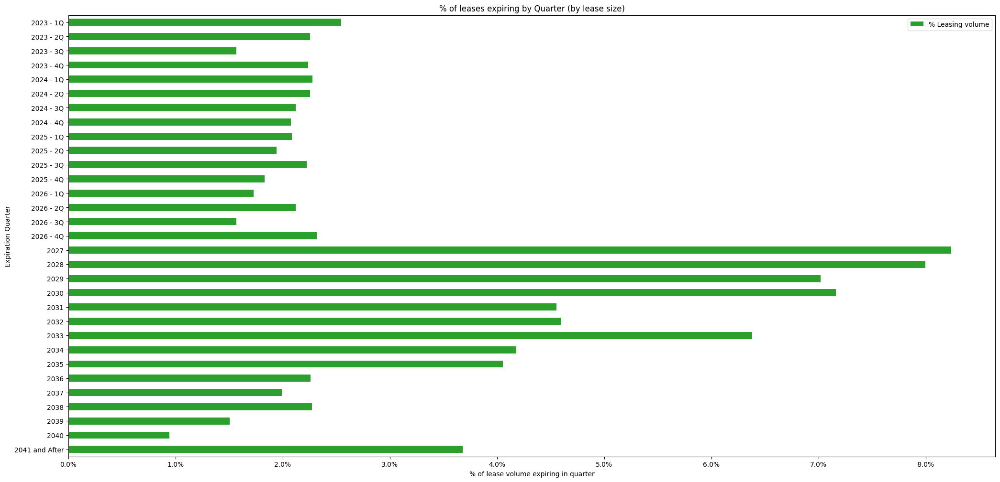

In [30]:
start_year = 2023  # starting year for the plot

# Refresh the expiration quarter column
data['Expiration Quarter'] = data['Expiration_date_monthend'].dt.year.astype(str) + ' - ' + data['Expiration_date_monthend'].dt.quarter.astype(str) + 'Q'
# Get the sum of the expiration sqft in each quarter
expiration_data = data.groupby(['Expiration Quarter'])['Transaction SQFT'].sum().reset_index()

# We modify the expiration quarter to only show by-year data after 2026
# keep data after start_year
# we apply a lambda function to the quarter series. 'x' here is the single quarter, and we get 1/0 back to slice the data
expiration_data = expiration_data[expiration_data['Expiration Quarter'].apply(lambda x: int(x[:4])) >= start_year]
# for the next 3 years, plot quarterly data, else plot annual
expiration_data['Expiration Quarter'] = expiration_data['Expiration Quarter'].apply(lambda x: x if int(x[:4]) < start_year + 4 else x[:4])
# combine all square footage expiring after 2040 into one group
expiration_data['Expiration Quarter'] = expiration_data['Expiration Quarter'].apply(lambda x: x if int(x[:4]) < start_year + 18 else '{} and After'.format(start_year + 18))
# Groupby again on the modified expiration quarter
expiration_data = expiration_data.groupby(['Expiration Quarter'])['Transaction SQFT'].sum().reset_index()

expiration_data['Transaction SQFT'] = expiration_data['Transaction SQFT'] / 1e6
expiration_data = expiration_data.sort_values(by = 'Expiration Quarter', ascending = False)

# horizontal bar chart
expiration_data_plot = expiration_data.set_index('Expiration Quarter')
expiration_data_plot.plot.barh(stacked = True, figsize = (25, 12), title = 'Square Feet of Leases Expiring by Quarter (In Million Sq. Ft.)')
plt.xlabel('Square Feet of Leases Expiring in Quarter (Millions)')
plt.show()

# plot % of square footage expring.
expiration_data['% Leasing volume'] = expiration_data['Transaction SQFT'] * 100 / expiration_data['Transaction SQFT'].sum()
expiration_data = expiration_data.drop(columns = 'Transaction SQFT')
expiration_data_plot = expiration_data.set_index('Expiration Quarter')
expiration_data_plot.plot.barh(stacked = True, figsize = (25, 12), title = '% of leases expiring by Quarter (by lease size)', color = 'tab:Green')
plt.xlabel('% of lease volume expiring in quarter')
plt.gca().xaxis.set_major_formatter(mticker.PercentFormatter())
plt.show()

## 1.4. Building Age

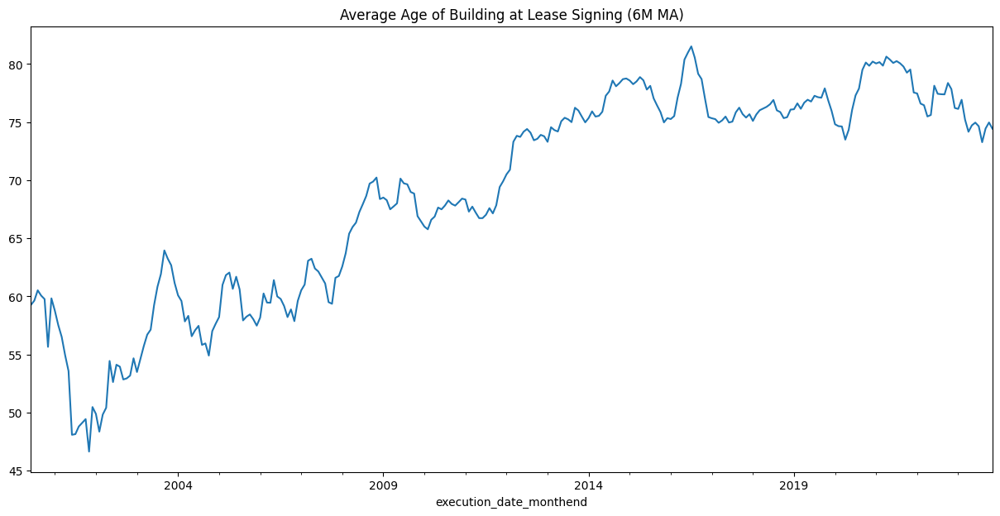

In [31]:
mean_ages = data.groupby('execution_date_monthend')['Age Building'].mean()
mean_ages.rolling(6).mean().dropna().plot(figsize = (15, 7), title = 'Average Age of Building at Lease Signing (6M MA)')
plt.show()

## 1.5 Duration of Office Leases 
### 1.5.1. Average Lease Duration

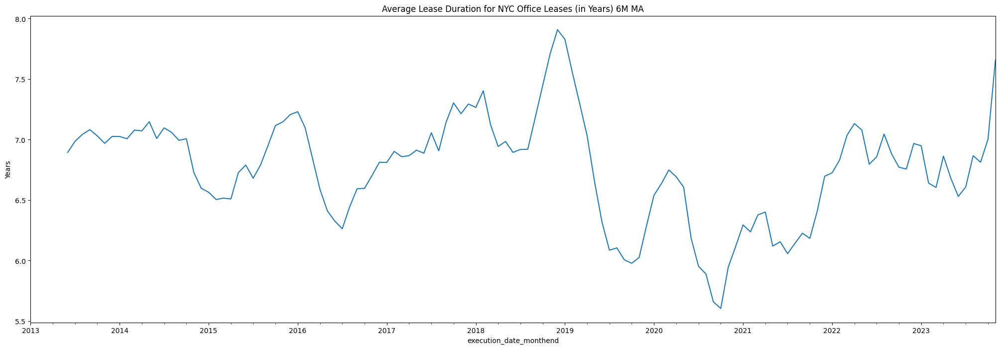

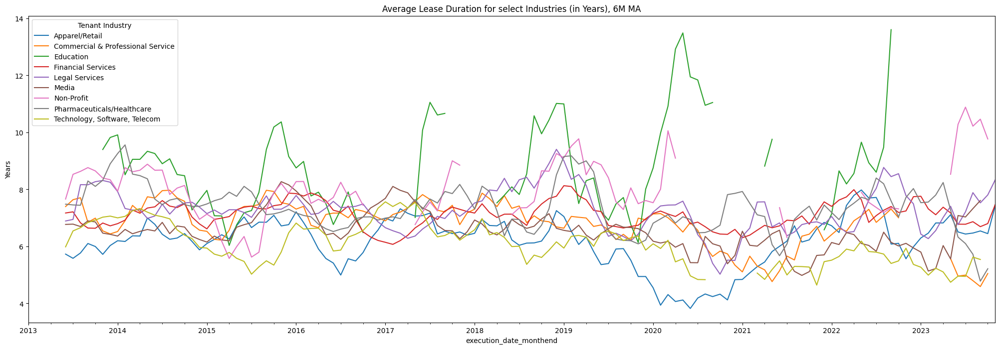

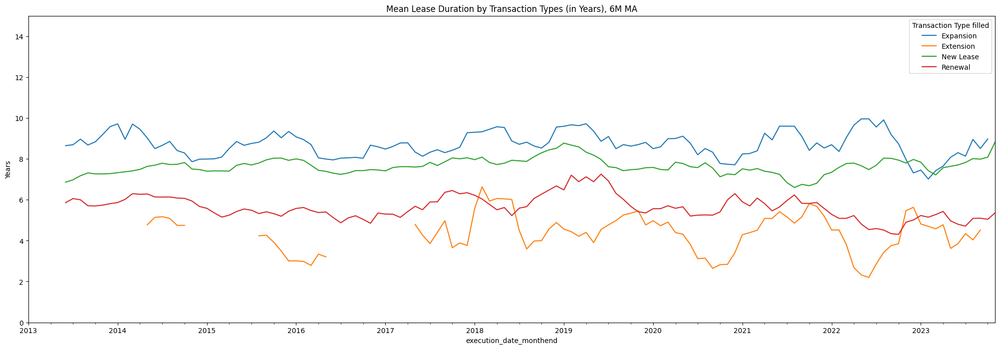

In [32]:
# we want to show the duration in years
duration = data_10Y[data_10Y['Lease Term'].notna()].groupby(['execution_date_monthend'])['Lease Term'].mean() / 12
duration.rolling(6).mean().plot(figsize = (25, 8), title = 'Average Lease Duration for NYC Office Leases (in Years) 6M MA')
plt.ylabel('Years')
plt.show()

# By Tenant Industry
duration_industry = data_10Y[data_10Y['Lease Term'].notna()].groupby(['execution_date_monthend', 'Tenant Industry'])['Lease Term'].mean() / 12
duration_industry = duration_industry.reset_index()
duration_industry = duration_industry[duration_industry['Tenant Industry'].isin(major_industries)]
duration_industry = duration_industry.pivot(columns = 'Tenant Industry', index = 'execution_date_monthend', values = 'Lease Term')
duration_industry = duration_industry.rolling(6).mean()
duration_industry.plot(figsize = (25, 8), title = 'Average Lease Duration for select Industries (in Years), 6M MA')
plt.ylabel('Years')
plt.show()

# By Transaction type
duration_ttype = data_10Y[data_10Y['Lease Term'].notna()].groupby(['execution_date_monthend', 'Transaction Type filled'])['Lease Term'].mean() / 12
duration_ttype = duration_ttype.reset_index()
duration_ttype = duration_ttype[duration_ttype['Transaction Type filled'] != 'Other']
duration_ttype = duration_ttype.pivot(columns = 'Transaction Type filled', index = 'execution_date_monthend', values = 'Lease Term')
duration_ttype = duration_ttype.rolling(6).mean()
duration_ttype.plot(figsize = (25, 8), title = 'Mean Lease Duration by Transaction Types (in Years), 6M MA')
plt.ylim(0.0, 15.)
plt.ylabel('Years')
plt.show()

### 1.5.2 Leasing Volume by Duration Bucket

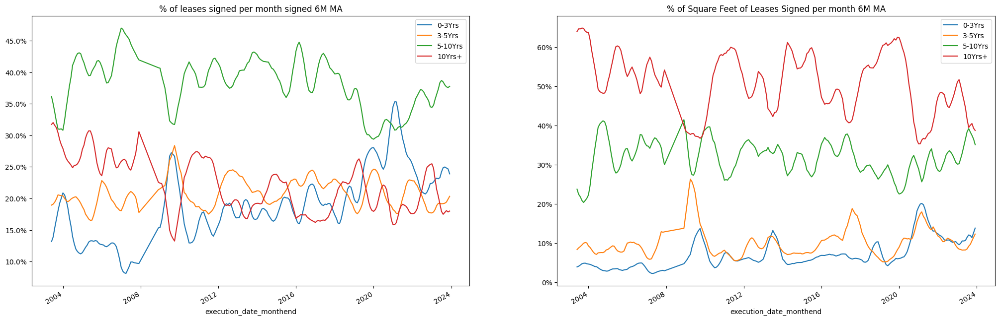

In [33]:
fig, ax = plt.subplots(1,2, figsize = (25,8))

def plot_duration_by_bucket(grouper, ax, title):
    """
    grouper: string; column name by which you want to group
    ax: matplotlib subplot object
    title: string; plot title
    """
    # group by lease term bucket
    counts_by_bucket = data.groupby(['execution_date_monthend', 'Lease Term Bucket'])[grouper].sum().reset_index()
    counts_by_bucket_pivot = counts_by_bucket.pivot(columns = 'Lease Term Bucket', index = 'execution_date_monthend', values = grouper).rolling(6).mean()
    counts_by_bucket_pivot = counts_by_bucket_pivot[['0-3Yrs', '3-5Yrs', '5-10Yrs', '10Yrs+']]
    counts_by_bucket_pivot = counts_by_bucket_pivot.rolling(6).mean()

    perc_by_bucket = counts_by_bucket_pivot.join(counts_by_bucket_pivot.sum(axis = 1).to_frame()).rename(columns = {0: 'Total'}).dropna()
    
    # calculate the ratio
    for col in ['0-3Yrs', '3-5Yrs', '5-10Yrs', '10Yrs+']:
        perc_by_bucket[col] /= perc_by_bucket['Total']
    # plot
    (perc_by_bucket.drop(columns = ['Total']) * 100).plot(ax = ax, title = title)
    ax.yaxis.set_major_formatter(mticker.PercentFormatter())

# plot the % of the counts (recall that counts is equivalent to summing the ones column)
plot_duration_by_bucket('Ones', ax[0], '% of leases signed per month signed 6M MA')

# plot the % of the square footage
plot_duration_by_bucket('Transaction SQFT', ax[1], '% of Square Feet of Leases Signed per month 6M MA' )

## 1.6. Net Effective Rents by Duration

#### $\color{red}{\text{Think-Pair-Share Task 2}}$ 

#### Do short-term tenants pay higher or lower rents compared to long-term tenants? 

Plot the 6-month rolling-window average starting rent for various lease term buckets used in section 1.5 over the last 10 years.

Your plot should have 4 lines, one each for 0-3 years, 3-5 years,...

Here we plot the raw starting rent. You can also look at deflated rent later by yourself.

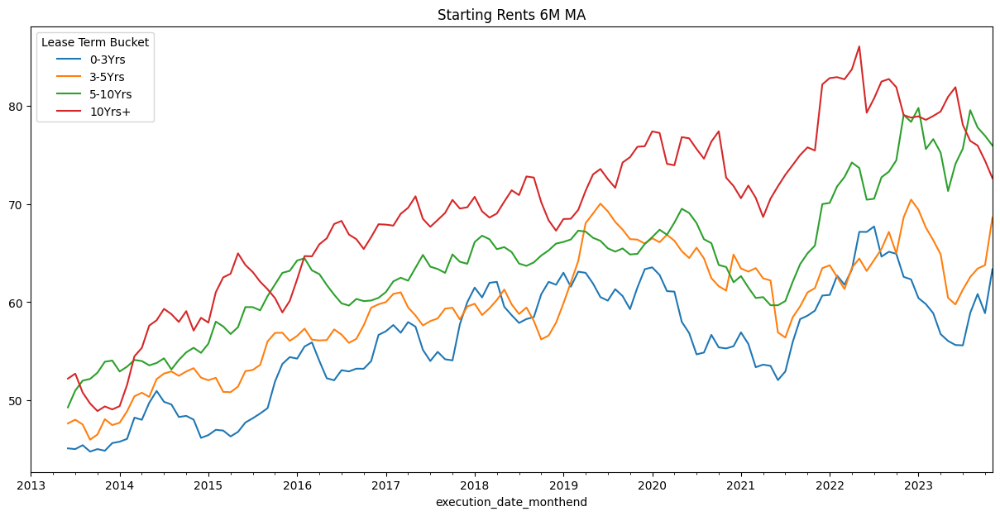

In [34]:
rents_by_bucket = data_10Y.groupby(['execution_date_monthend', 'Lease Term Bucket'])['Starting Rent (USD) (per year)'].mean().reset_index()
rents_by_bucket_pivot = rents_by_bucket.pivot(columns = 'Lease Term Bucket', index = 'execution_date_monthend', values = 'Starting Rent (USD) (per year)')
rents_by_bucket_pivot = rents_by_bucket_pivot[['0-3Yrs', '3-5Yrs', '5-10Yrs', '10Yrs+']]
rents_by_bucket_pivot.rolling(6).mean().plot(figsize = (15,7), title = 'Starting Rents 6M MA')
plt.show()

Composition effects, probably. Long term leases are in higher quality buildings probably.

## 1.7 Concessions 
### 1.7.1. Free Rent and Tenant Improvements
We begin by looking at the % of months that are rent free, a typical concession to induce tenants to sign long-term leases. We then look at tenant improvements, work paid for by the landlord to outfit the space to the tenant's needs. We express TI relative to the starting rent in the first year of the contract.

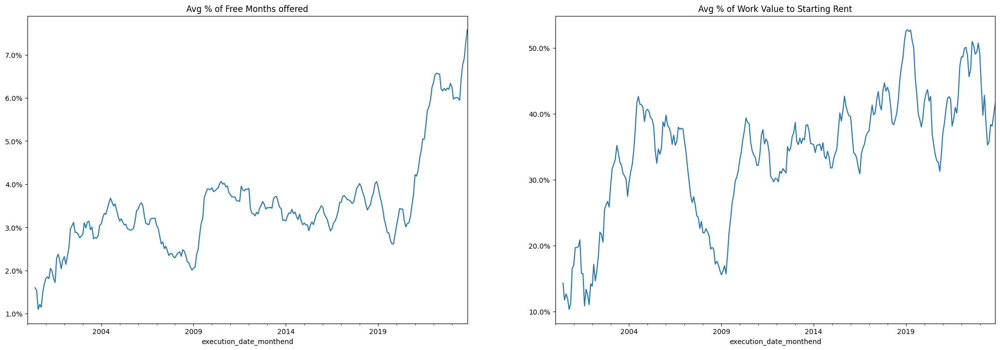

In [35]:
fig, ax = plt.subplots(1, 2, figsize = (25, 8))
# plot free months
perc_free = data.groupby(['execution_date_monthend'])['perc_free'].mean().rolling(6).mean()
(perc_free * 100).plot(ax = ax[0], title = 'Avg % of Free Months offered')

# plot tenant improvements, called work value, relative to the starting rent (in the first year of the contract)
data['WorkVl_to_effent'] = data['Work Value (USD)'] / data['Starting Rent (USD) (per year)']
perc_work = data.groupby(['execution_date_monthend'])['WorkVl_to_effent'].mean().rolling(6).mean()
(perc_work * 100).plot(ax = ax[1], title = 'Avg % of Work Value to Starting Rent')

# format the y axis as %
ax[0].yaxis.set_major_formatter(mticker.PercentFormatter())
ax[1].yaxis.set_major_formatter(mticker.PercentFormatter())
plt.show()

### 1.7.2 Overall Concessions
We define the ratio of annual net effective rent to the annual starting rent as a measure of overall concessions in the lease contract.

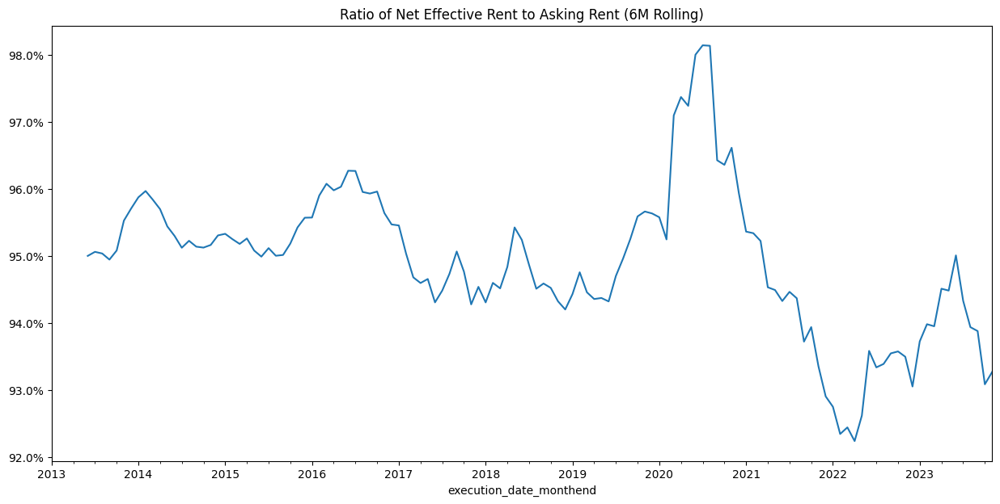

In [36]:
# plot the ratio of net effective rent to starting rent
fig, ax = plt.subplots(figsize = (15, 7))

(data_10Y.groupby('execution_date_monthend')['effective_to_starting'].mean().rolling(6).mean() * 100).plot(ax = ax)
ax.yaxis.set_major_formatter(mticker.PercentFormatter())
ax.set_title('Ratio of Net Effective Rent to Asking Rent (6M Rolling)')
plt.show()

## 1.8. Small vs. Large Tenants

In [37]:
# Define a function to plot the sum stats by different categories
def size_analysis(col_name, title, select_cols = None):
    """
    col_name: string; name of the column whose quartiles are to be plotted
    title: string; can be anything. Just the name in the plot title
    select_cols: None or list. If None, will plot net effective rents, mean square footage, etc. unless a specific column is specified
    """
    # get the mean and sum of sqft for each quartile of employee size and month
    emp_size_mean = data_5Y.groupby(['execution_date_monthend', col_name])[['Net Effective Rent (USD) (per year)',  'Transaction SQFT']].mean().rename(columns = {'Transaction SQFT': 'Mean Square Footage'})
    emp_size_sum = data_5Y.groupby(['execution_date_monthend', col_name])[['Dollar_val_annualized',  'Transaction SQFT']].sum().rename(columns = {'Transaction SQFT': 'Total Square Footage'})
    emp_size = emp_size_sum.join(emp_size_mean).reset_index()
    emp_size = emp_size.sort_values(by = ['execution_date_monthend'])
    
    # generate axis for the selected columns
    if select_cols is None:
        select_cols = set(list(emp_size)) - {'execution_date_monthend', 'Employee_size'}
        fig, ax = plt.subplots(2,2, figsize = (25, 15))
        ax = util.flatten(ax) # flatten the 2*2 object to 1D, so that we can iterate over it using 1D index
    else:
        fig, ax = plt.subplots(len(select_cols), figsize = (15, 7))
        ax = [ax]

    # Plot the sum stats columns one by one
    for i, col in enumerate(select_cols):
        emp_size_pivot = emp_size.pivot(columns = col_name, index = 'execution_date_monthend', values = col)
        emp_size_pivot.rolling(6).mean().plot(ax = ax[i])
        # use color map
        cmap = plt.get_cmap('PiYG')
        colors = cmap(np.linspace(0, 1, len(list(emp_size_pivot))))
        
        for j, c in enumerate(emp_size_pivot.columns):
            ax[i].get_lines()[j].set_color(colors[j])
            

        ax[i].legend(list(emp_size_pivot))
        ax[i].set_title('{} By {} Quartiles 6M MA'.format(col, title))
        ax[i].axvline(dt.date(2020,1,31), color="cyan", linestyle="dashed") # add a vertical line to indicate the start of the pandemic
    plt.show()

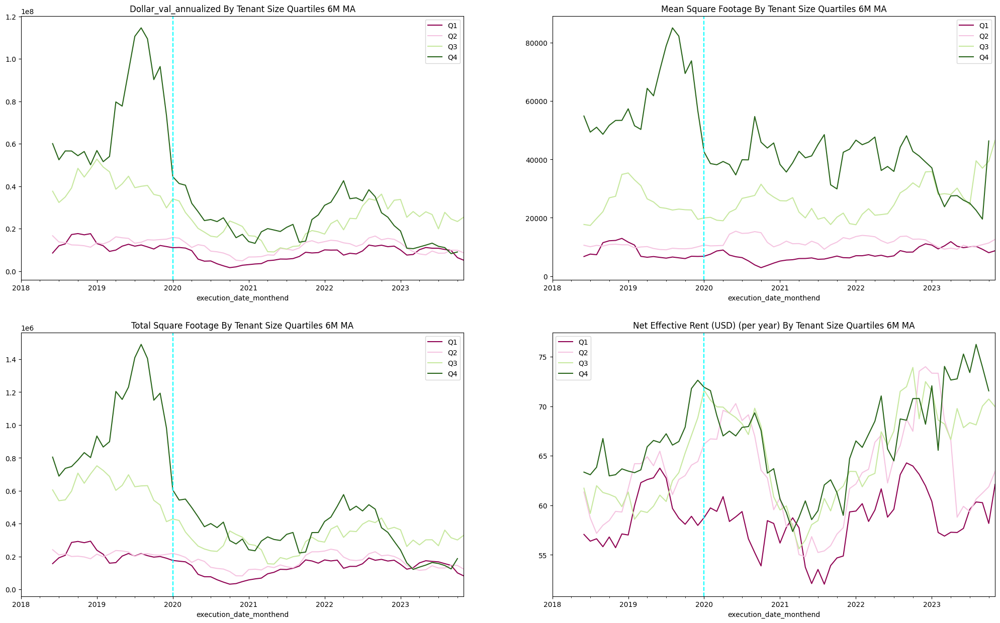

In [38]:
# By Tenant Employee Size
# Q4 (lightest line) stands for the top 25%, Q1 stands for the bottom 25%
# We can see that the larger tenants tend to rent larger and more expensive space
# Note that here we average over contracts instead of aggregating onto the tenant level, so sometimes the results are not monotonic
# Also note that we face a large missing data problem in 2023, so the results in 2023 are not very reliable
size_analysis(col_name = 'Employee_size', title= 'Tenant Size')

## 1.9. NER by Lease Size and Building Size

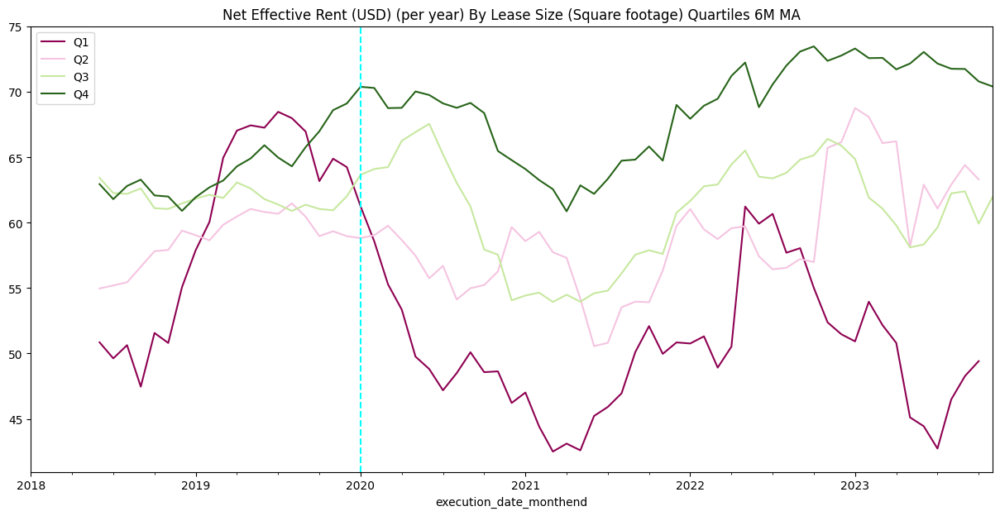

In [39]:
# NER by lease size
size_analysis(col_name ='lease_size', title= 'Lease Size (Square footage)', select_cols= ['Net Effective Rent (USD) (per year)'])

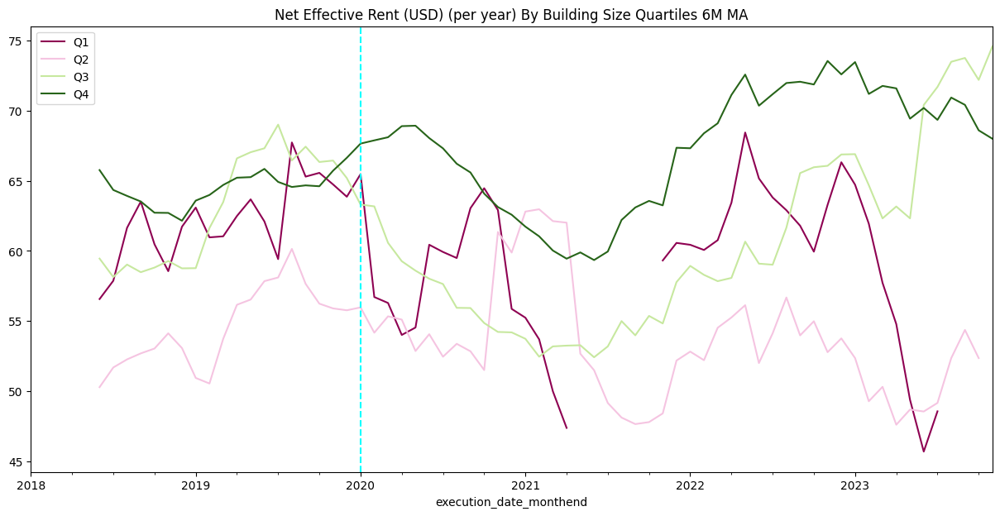

In [40]:
# NER by building size
size_analysis(col_name='building_size', title='Building Size', select_cols=['Net Effective Rent (USD) (per year)'])

## 1.10 Early Lease Signing 

#### $\color{red}{\text{Think-Pair-Share Task 3}}$ 

#### Did Covid make renters sign early? 

Renters often sign leases months before they plan to occupy the space. They might want to do this for various reasons, including in order to get favourable deals. Plot the (3-month moving) average number of months between the commencement date and the execution date over the last 5 years.

In [41]:
# Hint: you need to clean the format of data_5Y['commencement_date_monthend'] and data_5Y['execution_date_monthend'] before using them


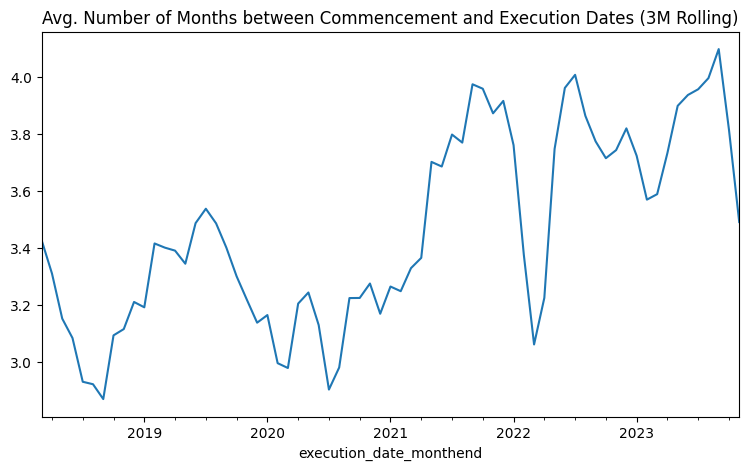

In [42]:
# Get the date gap
data_5Y['diff_days'] = (pd.to_datetime(data_5Y['commencement_date_monthend'].dt.date) - pd.to_datetime(data_5Y['execution_date_monthend'].dt.date)).dt.days
# Convert into month gap
data_5Y['diff_days'] = data_5Y['diff_days'] / 30

data_5Y.groupby('execution_date_monthend')['diff_days'].mean().rolling(3).mean().dropna().plot(figsize = (9, 5))
plt.title('Avg. Number of Months between Commencement and Execution Dates (3M Rolling)')
plt.show()

## 1.11 Expected Growth Rate of Rents Embedded in Lease Contract

We have information on rent schedules of each lease. Using these rent schedules, we can calculate the implied growth rate of the rents for the next several years. Lease contracts allow us to peek into the market participants' expectations of future rents.

In [43]:
data['Rent Schedule (USD)'].dropna().head(10)

3             0.00/4m, 100.00/5y, 105.00/5y
5               0.00/4m, 31.00/5y, 32.00/5y
6              43.00/2y, 46.00/3y, 49.00/5y
8              26.50/5y, 29.50/5y, 32.50/5y
9               0.00/4m, 40.00/5y, 10.00/5y
10                       48.00/5y, 53.00/4y
11              0.00/4m, 44.00/5y, 49.00/4y
12             56.00/2y, 57.00/1y, 59.00/4y
15    0.00/3m, 57.00/5y, 61.00/1y, 62.00/5y
16    0.00/5m, 40.00/2y, 42.00/4y, 44.00/3y
Name: Rent Schedule (USD), dtype: object

In [44]:
# Get the last rent in the rent schedule. Return np.nan if the rent schedule is empty
data["last_rent"] = data["monthly_rent_schedule"].apply(lambda x: np.nan if np.isnan(np.nan) else x[-1])
# Use the NER as the last rent if the rent schedule is empty
data['last_rent'] = data['last_rent'].fillna(data["Net Effective Rent (USD) (per year)"])
data['last_rent'].head(15)

0     40.952400
1     20.000000
2     31.687500
3     99.193604
4     28.600000
5     30.483900
6     46.900002
7     21.268299
8     27.166700
9     20.806499
10    50.222198
11    44.571400
12    55.714298
13    29.428600
14    36.833302
Name: last_rent, dtype: float64

In [45]:
# use leases executed from 2014 to 2023 and commenced before 2023
lease_expectations = data[(data['commencement_date_monthend'].dt.date <= last_data_download_quarter) & (data['execution_date_monthend'].dt.date <= last_data_download_quarter)]
lease_expectations = lease_expectations[lease_expectations['execution_date_monthend'].dt.date > dt.date(2014, 1, 30)]

# Include only the months which have at least 10 leases
# use value_counts to get the counts of each month. It returns a series with the month as index and the counts as values
lease_val_counts = lease_expectations['execution_date_monthend'].value_counts()
lease_val_counts = lease_val_counts[lease_val_counts > 10]
# keep the months which have at least 10 leases
lease_expectations = lease_expectations[lease_expectations['execution_date_monthend'].isin(lease_val_counts.index)]

# drop observations where we do not have the rent schedule
lease_expectations = lease_expectations[lease_expectations['Rent Schedule (USD)'].notna()]

lease_expectations = lease_expectations[['commencement_date_monthend', 'monthly_rent_schedule', 'lease_code', 'execution_date_monthend', 'Transaction Quarter', 'Transaction SQFT']]
lease_expectations

,commencement_date_monthend,monthly_rent_schedule,lease_code,execution_date_monthend,Transaction Quarter,Transaction SQFT
16406,2014-01-31,"[0.0, 0.0, 0.0, 0.0, 34.0, 34.0, 34.0, 34.0, 3...",NY_2014_Q1_225063,2014-01-31,2014 - Q1,3485
16407,2014-01-31,"[0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 36.0, 36.0, 36...",NY_2014_Q1_225066,2014-01-31,2014 - Q1,3540
16408,2014-01-31,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NY_2014_Q1_225071,2014-01-31,2014 - Q1,23411
16409,2014-03-31,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NY_2014_Q1_225070,2014-01-31,2014 - Q1,28638
16410,2014-01-31,"[87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87....",NY_2014_Q1_225065,2014-01-31,2014 - Q1,27000
...,...,...,...,...,...,...
32845,2023-12-31,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NY_2023_Q3_195014,2023-09-30,2023 - Q3,19256
32847,2023-12-31,"[0.0, 0.0, 0.0, 41.0, 41.0, 41.0, 41.0, 41.0, ...",NY_2023_Q3_195042,2023-09-30,2023 - Q3,1250
32853,2023-12-31,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",NY_2023_Q3_195029,2023-09-30,2023 - Q3,18364
32861,2023-12-31,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 85.0, 85.0, 85....",NY_2023_Q3_195025,2023-09-30,2023 - Q3,41900


In [46]:
# Define the years for which we want to calculate the growth rates
check_years = [2, 4, 5, 7, 10]  

# README: First check the apply command in the next cell.
# Then look at the last function "get_mean_rentgrowth_lease()" first, which is the first function to be called in apply. 
# Finally look at "get_one_schedule()" and "get_growth_rate()" when they are called by "get_mean_rentgrowth_lease()"


# Function to convert a single list of rent schedule into a dataframe
def get_one_schedule(x):
    """
    x: one row of pandas dataFrame
    cleans the monthly schedule of rents/converts it to dataframe with dates as index
    """
    # Ge the start and end month of the lease
    commendement_date = x['commencement_date_monthend'].date()
    len_range = len(x['monthly_rent_schedule'])
    end_date = (commendement_date + pd.offsets.MonthEnd(len_range)).date() # when we add MonthEnd to a monthend date, it gives one month ahead date
    # Get the list of dates between the start and end date (The end_date above is one month after the end of the lease so we use [:-1])
    dates = list(pd.date_range(start = commendement_date, end = end_date, freq = '1M').date[:-1])
    lease_code = x['lease_code'] 
    # Create a dataframe with the monthend dates as index and the lease code as column. Fill the dataframe with the rent schedule
    ls_df = pd.DataFrame(x['monthly_rent_schedule'], index = dates, columns = [lease_code]).reset_index().rename(columns = {'index': 'Date'})
    return ls_df

# Define a function to calculate the growth rate for each column (contract)
def get_growth_rate(series, horizon, drop_neg_outlier):
    """
    series: pandas series; a column of the all_lease_schedule dataframe
    horizon: int; the number of years to look forward to calculate the growth rate
    drop_neg_outlier: boolean; if true, will drop very negative growth rates (e.g., NY_2023_Q2_195126 ends up with -80% growth rate for 2y)
    """
    # get the first non-zero rent
    horizon *= 12  # convert year horizon to month horizon
    first_non_zero = series[series != 0].first_valid_index()
    # if the first non-zero rent is None (namely can't find nonzero rent), return growth rate = np.nan
    if first_non_zero is None:
        return np.nan
    # get the rent after the horizon 
    # try to find the rent after the horizon
    try:
        rent_after_horizon = series[first_non_zero + pd.DateOffset(months = horizon)]
    # if the month after the horizon goes beyond the last month in the series, return growth rate = np.nan
    except:
        rent_after_horizon = np.nan
    # # if the rent after the horizon is np.nan, return np.nan
    # if np.isnan(rent_after_horizon):
    #     return np.nan
    # calculate the annual growth rate
    growth_rate_for_this_contract = (rent_after_horizon / series[first_non_zero])**(12/horizon) -1
    if drop_neg_outlier and growth_rate_for_this_contract < -0.2:
        return np.nan
    else:
        return growth_rate_for_this_contract


# Define a function to get the average growth rates of rents
def get_mean_rentgrowth_lease(grp, drop_neg_outlier = True):
    """
    grp: grouped dataframe. generally grouped by execution date
    drop_neg_outlier: boolean; if true, will drop very negative growth rates (e.g., NY_2023_Q2_195126 records -80% growth rate for 2y)
    return: growth rates for each horizon (e.g., 2y, 4y, 5y, 7y, 10y)
    """
    grp.reset_index(inplace = True)
    all_lease_schedule = pd.DataFrame()

    # iterate over rows (contracts with the same execution month), get the rent schedule and clean it
    for row_name, row in grp.iterrows():
        monthly_rent_schedule = row['monthly_rent_schedule']
        if type(monthly_rent_schedule) != list:  # we skip the contract if its monthly_rent_schedule is not a list (e.g., if it is np.nan)
            continue
        if len(all_lease_schedule) == 0:    # we add a new column if the container all_lease_schedule is empty
            # The output of get_one_schedule(row): its column name is the lease code, index is the monthend dates, and values are the rents
            all_lease_schedule = get_one_schedule(row)   
        else:   # otherwise we merge the new column with all_lease_schedule
            all_lease_schedule = pd.merge(all_lease_schedule, get_one_schedule(row), on = 'Date', how = 'outer') 

    # sort the schedule as the dates may not be in order after merging
    all_lease_schedule = all_lease_schedule.sort_values(by = ['Date'])
    all_lease_schedule['Date'] = pd.to_datetime(all_lease_schedule['Date'])
    all_lease_schedule.set_index('Date', inplace = True)
    # Now we have a dataframe with the monthend dates as the row index and each lease code taking up one column. The values are the rents in that month.
    # At the start of the dataframe (namely at the execution month with which we group the df), 
    # the rents can be np.nan (if the lease has not commenced yet) or 0 (if the lease contain concessions)
    # We define the growth rate of a certain horizon (e.g., 2y) as the change between the first non-zero rent and the rent after the horizon
    # For example, if a lease is executed in 2020-01-31 and commenced in 2020-07-31, we will check the growth between 2020-07-31 and 2022-07-31 as the 2y growth rate on 2020-01-31
    # There exist many alternative definitions, say we can backfill the first non-zero rent to the execution month and then calculate the growth rate starting from the execution month
    # But we choose the former definition as it makes the growth rate more comparable across contracts and time.

    # Apply get_growth_rate to each column (lease) of the all_lease_schedule dataframe
    growth_rates = pd.Series()
    for horizon in check_years:
        growth_rates.loc['growth_{}Y'.format(horizon)] = all_lease_schedule.apply(lambda x: get_growth_rate(x, horizon, drop_neg_outlier), axis = 0).mean()

    return growth_rates

In [47]:
# calculate the rent growth rates for each execution month in parallel applying the get_mean_rentgrowth_lease() function above
lease_expectations_op_month_dropeq = lease_expectations.swifter.groupby('execution_date_monthend').apply(lambda x: get_mean_rentgrowth_lease(x, drop_neg_outlier=True))
ray.shutdown() # shut down the ray cluster to release the memory
# NOTE: if you encounter errors, comment out the lines above and use the line below, which takes approximately 4 minutes to run. 
# lease_expectations_op_month_dropeq = lease_expectations.groupby('execution_date_monthend').apply(lambda x: get_mean_rentgrowth_lease(x, True))

# check the result
lease_expectations_op_month_dropeq

  0%|          | 0/16 [00:00<?, ?it/s]

2024-02-20 10:03:14,910	INFO worker.py:1724 -- Started a local Ray instance.


,growth_2Y,growth_4Y,growth_5Y,growth_7Y,growth_10Y
execution_date_monthend,,,,,
2014-01-31,0.001136,0.003701,0.013311,0.010884,0.013113
2014-02-28,0.000844,0.003902,0.012289,0.011741,0.010047
2014-03-31,0.001372,0.002446,0.009785,0.009793,0.011895
2014-04-30,0.001751,0.002917,0.012389,0.010757,0.010462
2014-05-31,0.000774,0.002211,0.010668,0.009185,0.010672
...,...,...,...,...,...
2023-05-31,0.009973,0.010387,0.016132,0.010508,0.008648
2023-06-30,0.009542,0.009536,0.014178,0.011540,0.014438
2023-07-31,0.004591,0.007260,0.011604,0.010024,0.008826


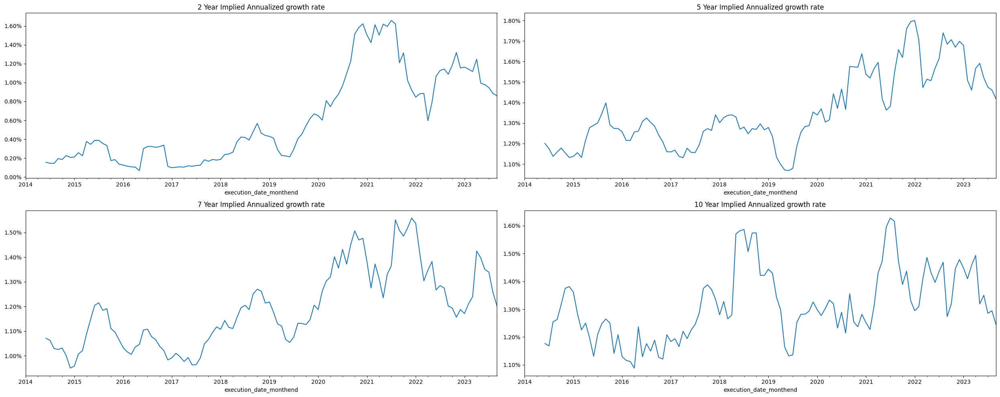

In [48]:
# plot growth rates for each execution month and horizon
fig, ax = plt.subplots(2,2, figsize = (25, 10))
ax = util.flatten(ax)

for i, year in enumerate([2, 5, 7, 10]):
    (lease_expectations_op_month_dropeq["growth_{}Y".format(year)].rolling(6).mean() * 100).plot(ax = ax[i], title = '{} Year Implied Annualized growth rate'.format(year))
    ax[i].yaxis.set_major_formatter(mticker.PercentFormatter())
fig.tight_layout()
plt.show()

# It looks like the 2y/5y rent growth increases around 2020~early 2021, when the initial NER falls 
# 2y/5y rent growth remains elevated in 2022~2023, when the inflation is high
# Note: the initial trend of the rent growth may not be reliable due to the small sample size

## 1.12 A+ and Young Buildings and Flight-to-Quality

You may have heard in the news that some big tech tenants signed expensive leases in new buildings during the pandemic (e.g., Facebook at Hudson Yards). One explanation is flight-to-quality: prestigious firms with deep pockets may want to move to fancy buildings for a variety of reasons, one of which is to retain and recruit talent. We will investigate this in our data. 

Let us consider two definitions of "top" buildings:

1. Young buildings: building age <= 10years
2. A+ buildings: class A buildings where a new lease was signed in the current quarter that was in the top-10% most expensive leases in that submarket in that quarter

Next, we will construct these subsamples and check the dynamics in rent and space demand.

In [49]:
data.keys()

Index(['Transaction Quarter', 'transaction_year', 'execution_date_monthend',
       'Expiration_date_monthend', 'commencement_date_monthend',
       'Submarket_Filled', 'Tenant Industry', 'Tenant Industry filled',
       'Building Class', 'Transaction Type filled', 'Building Class Enhanced',
       'Transaction Type', 'Transaction SQFT', 'Ones', 'Dollar_val_annualized',
       'Starting Rent (USD) (per year)', 'Net Effective Rent (USD) (per year)',
       'Net Effective Rent deflated (USD) (per year)', 'Lease Term',
       'Lease Term Bucket', 'Lease Type', 'lease_size', 'building_size',
       'teleworkable_emp3', 'Work Value (USD)', 'effective_to_starting',
       'perc_free', 'monthly_rent_schedule', 'lease_code', 'Floors Occupied',
       'Employee_size', 'Rent Schedule (USD)', 'Rent_value_type',
       'Year Renovated', 'Age Building', 'Year Built', 'Building Size', 'City',
       'Tenant Code', 'Building Code', 'CPIAUCSL',
       'Net Effective Rent (USD) (per year) in 2023 Dolla

In [50]:
# Some cleaning
data['Net Effective Rent deflated (USD) (per year)'] = data['Net Effective Rent (USD) (per year)'] / data['CPIAUCSL']  # normalize to 2023 Dec dollar
data.dropna(subset=["Submarket_Filled"], inplace=True) # prevent the error of missing values in the submarket column

### 1.12.1 NER for high quality vs low quality buildings

In [51]:
# We first generate the Building Age Group Indicator
data['Building Age'] =   data['transaction_year']  - data['Year Built']
data['Building Age'] = pd.to_numeric(data['Building Age'], errors='coerce') # clean the format to numeric
data.loc[data['Building Age'] <=10, 'Building Age Group'] = '<=10 years'
data.loc[data['Building Age'] >10, 'Building Age Group'] = '>10 years'
print(data['Building Age Group'].value_counts())

Building Age Group
>10 years     31484
<=10 years      876
nan             587
Name: count, dtype: int64


In [52]:
# We then generate the Building Class Group Indicator (A+ vs others)

# First calculate the median rent among all the leases in a given building and transaction quarter
# We also group by submarket_filled just to keep the submarket column in the df. One building can only be in one submarket.
# The median rent within a building-quarter is representative of the building's quality in that quarter 
df = data[(data["Building Class"] == "A")].groupby(["Transaction Quarter", "Building Code", "Submarket_Filled"])["Net Effective Rent (USD) (per year)"].median().reset_index()

# Then calculate the 90th percentile rent among all buildings in a given transaction quarter and submarket
df_90th = df.groupby(["Transaction Quarter", "Submarket_Filled"])["Net Effective Rent (USD) (per year)"].apply(lambda x: np.percentile(x, 90)).reset_index()

# Merge the df of the median rent at the building level with the 90th percentile df
df = pd.merge(df, df_90th, on=["Transaction Quarter", "Submarket_Filled"], how="left")

# Keep building-quarter pairs with median rent greater than the 90th percentile rent in the submarket-quarter
# Since both dataframes contain the same variable Net Effective Rent (USD) (per year), the subscript _x is the NER in the original df and _y refers to the 90th percentile df
df = df[df["Net Effective Rent (USD) (per year)_x"] > df["Net Effective Rent (USD) (per year)_y"]]

# A list from 2000:Q1 to 2022:Q4
quarters = ["{} - Q{}".format(y, q) for y in range(2000, 2023) for q in range(1, 5)]
# keep building-quarter pairs in the target quarters
df = df[df['Transaction Quarter'].isin(quarters)].reset_index(drop=True)

# Now we extend the "A+" building identity to the following 10 years
# Define a blank df to collect (quarter - A+ building) pairs 
buildings_a_plus = pd.DataFrame()
# loop over all building-quarter pairs in the df
for ind in range(len(df)):
    df_temp = pd.DataFrame()
    
    # Once a building is an A+ building at t, treat it as A+ at t, t+1, ..., t+39 (40 quarters)
    # quarters is a list from 2000:Q1 to 2022:Q4. We find the index of the current quarter in the list by quarters.index()
    # and then slice by "[... : ...]" to take the next 39 quarters 
    # We then assign this 40-quarter list to the "Transaction Quarter" column of the df_temp
    df_temp['Transaction Quarter'] = quarters[quarters.index(df.loc[ind, 'Transaction Quarter']): quarters.index(df.loc[ind, 'Transaction Quarter']) + 40]
    # We then assign the building code to the "Building Code" column of the df_temp
    df_temp['Building Code'] = df.loc[ind, 'Building Code']
    # We vertically append the df_temp to the buildings_a_plus df (this step may generate many duplicates)
    buildings_a_plus = pd.concat([buildings_a_plus, df_temp], axis=0)

# Merge 'data' with 'buildings_a_plus' on specific columns to identify A+ buildings.
# A new column 'A+_Indicator' is added to indicate whether there is a match (=both) or not (=left_only)
data = data.merge(buildings_a_plus[['Transaction Quarter', 'Building Code']].drop_duplicates(),
                  on=['Transaction Quarter', 'Building Code'],
                  how='left', indicator='A+_Indicator')
# Convert the 'A+_Indicator' column into the 'Building Class A+' indicator.
data['Building Class A+'] = data['A+_Indicator'].apply(lambda x: 'A+' if x == 'both' else 'Others')
# Drop the temporary indicator column if no longer needed.
data.drop(columns=['A+_Indicator'], inplace=True)  

print(data['Building Class A+'].value_counts())

Building Class A+
Others    24900
A+         8047
Name: count, dtype: int64


In [53]:
START = '2018-01-31' # Start date for the plot
END = '2022-12-31'   # End date for the plot
MIN_PERIODS = 3      # Minimum periods for the rolling average

# Define a function to calculate the average NER for each group-month
def get_avg_NER(data, grouper):
    no_fe = data.copy()
    # Calculate the raw average NER for each group-month
    no_fe["revenue"] = no_fe["Net Effective Rent deflated (USD) (per year)"]  * no_fe["Transaction SQFT"]
    no_fe = no_fe.groupby(["execution_date_monthend", grouper])[['Transaction SQFT', "revenue"]].sum()
    no_fe["Average NER in group-month"] = no_fe["revenue"] / no_fe["Transaction SQFT"]
    no_fe = no_fe["Average NER in group-month"]
    no_fe = no_fe.reset_index(inplace=False)
    no_fe = no_fe.pivot(columns = grouper, index = 'execution_date_monthend', values = 'Average NER in group-month')

    # Calculate the average NER for each group-month after removing fixed effects
    # get_resids2() function in the util.py file will first remove FE and then weight the residuals by the transaction sqft 
    all_fe = util.get_resids2(data, 'Net Effective Rent deflated (USD) (per year)', ['Tenant Industry filled', 'Submarket_Filled', 'Transaction Type filled'], grouper= ['execution_date_monthend', grouper])
    all_fe = all_fe.reset_index(inplace=False)
    all_fe = all_fe.pivot(columns = grouper, index = 'execution_date_monthend', values = 'Net Effective Rent deflated (USD) (per year)').add(no_fe.mean())
    all_fe.columns = [i + ' (All FE)' for i in all_fe.columns]

    # rolling 6M
    no_fe = (no_fe.rolling(6, min_periods=MIN_PERIODS).mean())[START:END]
    all_fe = (all_fe.rolling(6, min_periods=MIN_PERIODS).mean())[START:END]
    # normalize NER with FE in 2020-01-31 to align the two series
    for col in no_fe.keys():
        all_fe[col + ' (All FE)'] -= all_fe[col + ' (All FE)']['2020-01-31'] - no_fe[col]['2020-01-31']

    return no_fe, all_fe

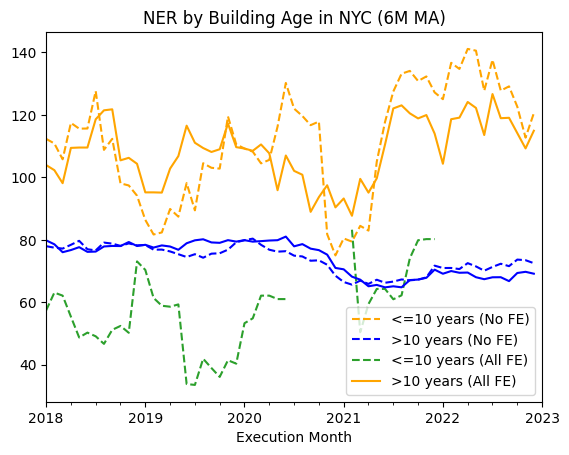

In [54]:
# get the series for the plot
no_fe, all_fe = get_avg_NER(data, 'Building Age Group')

# plot
fig, ax = plt.subplots()

# dash line for the raw average NER
no_fe.plot(title = 'Annualized Net Effective Rents (6M MA)', ax = ax, style = '--', color = ['orange', 'blue', 'tab:Green'])
# solid line for the NER after removing fixed effects
all_fe.plot(title = 'NER by Building Age in NYC (6M MA)', ax = ax, color = ['orange', 'blue', 'tab:Green'])
plt.legend(['<=10 years (No FE)', '>10 years (No FE)','<=10 years (All FE)', '>10 years (All FE)'])

ax.set_xlabel('Execution Month')

# Set major xticks with labels
ax = plt.gca()
years = [str(year) for year in range(2018, 2024)] # list from 2018 to 2023
ax.set_xticks(years) # Set x-ticks as years

plt.show()

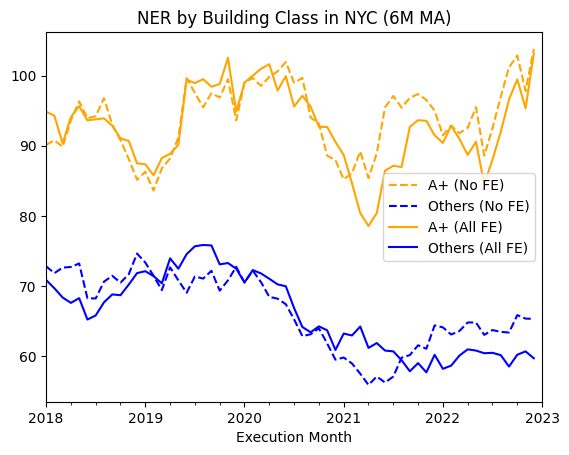

In [55]:
# get the series for the plot
no_fe, all_fe = get_avg_NER(data, 'Building Class A+')

# plot
fig, ax = plt.subplots()

# dash line for the raw average NER
no_fe.plot(title = 'Annualized Net Effective Rents (6M MA)', ax = ax, style = '--', color = ['orange', 'blue', 'tab:Green'])
# solid line for the NER after removing fixed effects
all_fe.plot(title = 'NER by Building Class in NYC (6M MA)', ax = ax, color = ['orange', 'blue', 'tab:Green'])
plt.legend(['A+ (No FE)', 'Others (No FE)','A+ (All FE)', 'Others (All FE)'])

ax.set_xlabel('Execution Month')

# Set major xticks with labels
ax = plt.gca()
years = [str(year) for year in range(2018, 2024)] # list from 2018 to 2023
ax.set_xticks(years) # Set x-ticks as years

plt.show()

### 1.12.2 Building occupancy for high quality vs low quality buildings
For the occupancy rate, we look at occupancy relative to the occupancy level in January 2020 since our data set does not cover all leases in NYC.

In [56]:
# A function to calculate the sqft of active leases and total building size for each month
def get_active_lease(df):   
    # convert the dates to period[M] format for comparison later  
    df['commencement_date'] = df['commencement_date_monthend'].dt.to_period('M') 
    df['expiration_date'] = df['Expiration_date_monthend'].dt.to_period('M') 
    df['execution_date'] = df['execution_date_monthend'].dt.to_period('M') 

    period_range = pd.period_range(start='2004-01', end='2024-12', freq='M')

    collector = []    # to collect the total sqft of active leases in each month
    collector2 = []   # to collect the building size in each month

    # for each month in the period range, calculate the total sqft of active leases
    for period in period_range:
        # slice the dataframe to get the active leases
        active_lease = df[(df['commencement_date'] <= period) & (df['expiration_date'] > period)] 

        collector.append((period.year, period.month, active_lease["Transaction SQFT"].sum()))
        collector2.append(df[df["execution_date"]<= period][
                                    ["Building Code", "Building Size"]].dropna().sort_values("Building Size",
                                                                                            ascending=True).drop_duplicates(
                keep="last")["Building Size"].sum())  # use the largest size for each building.

    return collector, collector2

# Get the average occupancy ratio for high and low quality buildings
def get_occupancy_high_low_quality(df_selected, df_complement):
    # For each group, get the sqft of active leases and total building size for each month
    active_lease_high_quality, total_size_high_quality = get_active_lease(df_selected)
    active_lease_low_quality, total_size_low_quality = get_active_lease(df_complement)

    # Clean the output from above (read data from different positions in the dictionary)
    # First clean the data for high quality buildings
    df_ = pd.DataFrame()
    df_["Month"] = [str(_[0] * 100 + _[1]) for _ in active_lease_high_quality]
    df_["active_lease_sqft"] = [_[2] for _ in active_lease_high_quality]  
    df_["building_size"] = [_ for _ in total_size_high_quality]

    # Calculate building occupancy rate 
    df_["occupancy_rate"] = df_["active_lease_sqft"] / df_["building_size"] * 100

    # Rename columns for high quality buildings
    df_.rename(columns={"active_lease_sqft": "active_lease_high_quality",
                        "building_size": "total_stock_high_quality",
                        "occupancy_rate": "occupancy_rate_high_quality"}, inplace=True)

    # Make a copy
    df__ = df_.copy(deep=True)

    # Then do the same for low quality buildings
    df_ = pd.DataFrame()
    df_["Month"] = [str(_[0] * 100 + _[1]) for _ in active_lease_low_quality]
    df_["active_lease_sqft"] = [_[2] for _ in active_lease_low_quality]
    df_["building_size"] = [_ for _ in total_size_low_quality]
    df_["occupancy_rate"] = df_["active_lease_sqft"] / df_["building_size"] * 100
    df_.rename(columns={"active_lease_sqft": "active_lease_low_quality",
                        "building_size": "total_stock_low_quality",
                        "occupancy_rate": "occupancy_rate_low_quality"}, inplace=True)

    # Merge occupancy data
    df_occ_merged = pd.merge(df__, df_, on="Month").set_index("Month")[["occupancy_rate_high_quality", "occupancy_rate_low_quality"]].rolling(6).mean()['201001': '202212']

    # Calculate relative occupancy rate (normalize to 100 in 2020-01)
    df_occ_merged['occupancy_rate_low_quality'] = df_occ_merged['occupancy_rate_low_quality'] / df_occ_merged.loc['202001', 'occupancy_rate_low_quality'] * 100
    df_occ_merged['occupancy_rate_high_quality'] = df_occ_merged['occupancy_rate_high_quality'] / df_occ_merged.loc['202001', 'occupancy_rate_high_quality'] * 100
    df_occ_merged.index = pd.to_datetime(df_occ_merged.index, format='%Y%m') + pd.offsets.MonthEnd(0) # convert the index to datetime format

    return df_occ_merged

<Figure size 1500x700 with 0 Axes>

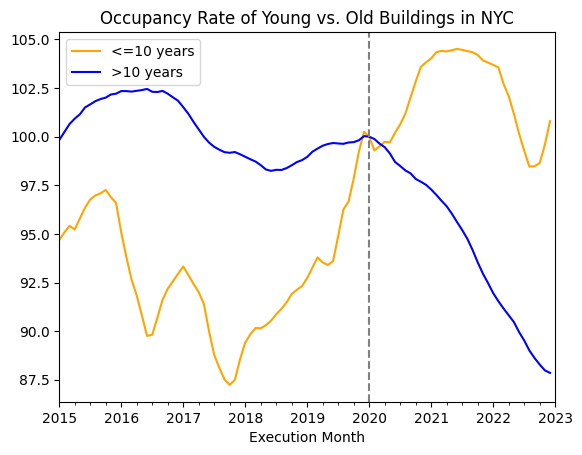

In [57]:
# Get the occupancy rate for young and old buildings
df_selected = data[data['Building Age Group'] == '<=10 years']
df_complement = data[data['Building Age Group'] == '>10 years']
df_occ_merged = get_occupancy_high_low_quality(df_selected, df_complement)
df_occ_merged.rename(columns={"occupancy_rate_low_quality": "<=10 years", "occupancy_rate_high_quality": ">10 years"}, inplace=True)

# Plot the occupancy rate for young and old buildings
plt.figure(figsize=(15, 7))
df_occ_merged['2015-01':'2022-12-31'].plot(color=['orange', 'blue'])
# add a vertical line
vertical_line = '2020-01' 
plt.axvline(pd.to_datetime(vertical_line), label=vertical_line, color="grey", linestyle='--')

plt.legend(['<=10 years', '>10 years'])
plt.title("Occupancy Rate of Young vs. Old Buildings in NYC")
plt.xlabel("Execution Month") 

# Set major xticks with labels
ax = plt.gca()
years = [str(year) for year in range(2015, 2024)]
ax.set_xticks(years) # Set x-ticks as years

plt.show()


<Figure size 1500x700 with 0 Axes>

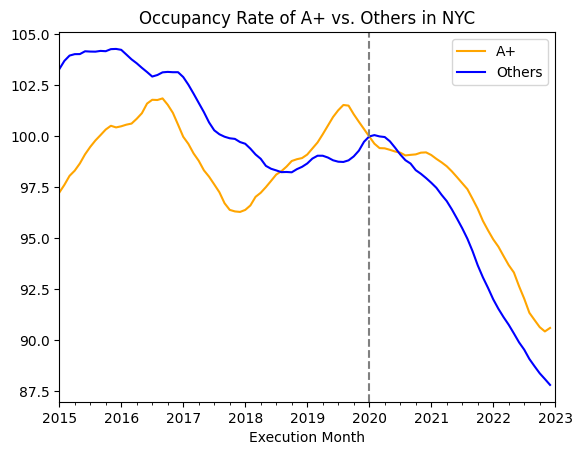

In [58]:
# Get the occupancy rate for A+ and other buildings
df_selected = data[data['Building Class A+'] == 'A+']
df_complement = data[data['Building Class A+'] == 'Others']
df_occ_merged = get_occupancy_high_low_quality(df_selected, df_complement)
df_occ_merged.rename(columns={"occupancy_rate_low_quality": "Others", "occupancy_rate_high_quality": "A+"}, inplace=True)

# Plot the occupancy rate for A+ and other buildings
plt.figure(figsize=(15, 7))
df_occ_merged['2015-01':'2022-12-31'].plot(color=['orange', 'blue'])
# add a vertical line
vertical_line = '2020-01' 
plt.axvline(pd.to_datetime(vertical_line), label=vertical_line, color="grey", linestyle='--')

plt.legend(['A+', 'Others'])
plt.title("Occupancy Rate of A+ vs. Others in NYC")
plt.xlabel("Execution Month") 

# Set major xticks with labels
ax = plt.gca()
years = [str(year) for year in range(2015, 2024)]
ax.set_xticks(years) # Set x-ticks as years

plt.show()


# Section 2. Linking Renewed Leases
We will try to link together leases that are renewed in this Section. 

1. This will provide the input variables of the renewal prediction model in Section4. We need the old lease's characteristics for prediction.
2. This will help us correct the `Transaction Type` variable in the CompStak data and provide a more accurate estimation of the renewal rate across time. The current `Transaction Type` variable is often incorrect, because it is filled out by a broker, not administratively determined.


## 2.1 Raw Identification of lease renewals
In Section 2.1, we will first construct a large set of lease pairs that are candidates for actual renewals.

As the `Tenant Name` and `Building Name` are cleaned by CompStak, **we require two leases to have the exact match on `Tenant Name` and `Building Name`** in order to enter the renewal pair pool. 

Then we will utilize the  `execution_date_monthend`, `commencement_date_monthend`, `Expiration_date_monthend` information of each lease. The idea is that the renewed lease's commencement date should not be too far from its old lease's expiration date, the same applied for the the renewed lease's execution date. This will help us filter mismatches in the candidate pool.

Here we will try the following two specifications:
$$Renewal:\, Same\, Building\, and\, Tenant\, Name\,,\, New\, Commencement\, Date\, \in\, [Old\, Expir.\, Date\, - 6\, months,\, Old\, Expir.\, Date\, + 18\, months]$$

$$Renewal:\, Same\, Building\, and\, Tenant\, Name\,,\, New\, Execution\, Date\, \in\, [Old\, Expir.\, Date\, - 24\, months,\, Old\, Expir.\, Date\, + 6\, months]$$

This will give us a raw identification of lease renewals. But two issues emerges in our result:
1. Some identified renewal pairs are not actual renewals. If the same firm leases extra spaces in the same building around the expiration of an old lease, the extra lease will be counted as renewals in our algo above. To address this, we will **apply more filters** in Section 2.2.
2. A lot of leases in the "unmatched" group are actually not new leases or the last leases. The old lease may be missing in the CompStak data, and it's even more likely that the renewaled lease is missing, as brokers may not present in renewals. This problem, however, can not be easily addressed.

In [79]:
def matching_algorithm_cleaned(df, matching_var, month_plus, month_minus):
    """define our utility function in matching leases, given the timing window
    params: df: data df 
            matching_var in ["commencement_date_monthend", "execution_date_monthend"]: which variable to match
            month_plus, month_minus: set time window to be [t - month_minus, t + month_plus]
    """ 
    
    # only allow execution and commencement date matching
    assert matching_var in ('execution_date_monthend', 'commencement_date_monthend')
    
    # the month deltas should be non-negative
    assert month_plus >= 0
    assert month_minus >= 0
    
    # the mapping from old variable to new variable
    matching_var_new = ''
    if matching_var == 'execution_date_monthend':
        matching_var_new = 'execution_new'
    else:
        matching_var_new = 'commencement_new'
    
    # create the df copy for the renewal leases
    df_new = df.copy(deep=True)[['Tenant Code', 'Building Code', matching_var, 'lease_code', 'Transaction Type', 'Floors Occupied', 'Transaction SQFT']]
    df_new.rename(columns={matching_var: matching_var_new, 
                     'lease_code': 'lease_code_new', 
                     'Transaction Type': 'trans_type_new', 
                     'Floors Occupied': 'floors_new', 
                     'Transaction SQFT': 'trans_sqft_new'},
                      inplace=True)
    
    # create the time window max, min
    df['date_temp_max'] = df['Expiration_date_monthend'].apply(lambda x: x.date() + relativedelta(months=month_plus))
    df['date_temp_min'] = df['Expiration_date_monthend'].apply(lambda x: x.date() - relativedelta(months=month_minus))
    
    # merge the new lease df with the old lease df on tenant ID and building ID
    df_compare = pd.merge(df_new, df, on=['Tenant Code', 'Building Code'])
    
    # cannot be self-matching
    df_compare['same_flag'] = df_compare['lease_code_new'] != df_compare['lease_code']
    df_compare = df_compare[(df_compare['same_flag'] != 0)]
    df_compare.drop(columns=['same_flag'], inplace=True)
    
    # select the date only (drop hours, minus and seconds etc)
    df_compare[matching_var] = df_compare[matching_var].apply(lambda x: x.date())
    
    # time window filters
    df_compare = df_compare[(df_compare[matching_var_new] <= df_compare['date_temp_max'])]
    df_compare = df_compare[(df_compare[matching_var_new] >= df_compare['date_temp_min'])]
    df_compare.reset_index(drop=True, inplace=True)
    
    # we also return the lease ID for the matched samples (both previous and renewal leases)
    matched_ids = df_compare['lease_code'].to_list() + df_compare['lease_code_new'].to_list()
    matched_ids = list(set(matched_ids))

    # Sometimes multiple old leases match to a single new lease and one old lease may match to multiple new leases according to this definition
    # But we should postpone dropping duplicates to after we have applied all the filters
    # df_compare.drop_duplicates(subset=['lease_code'], keep=False, inplace=True)
    # df_compare.drop_duplicates(subset=['lease_code_new'], keep=False, inplace=True)
    return (df_compare, matched_ids)

In [80]:
# First, we match the leases based on the commencement date
# Set the arguments of max months before and after old lease's expiration date
max_month_after_expiration = 18
max_month_before_expiration = 6
df_compare_com, matched_ids_com = matching_algorithm_cleaned(data, 'commencement_date_monthend', max_month_after_expiration, max_month_before_expiration)

# Second, we match the leases based on the execution date
# Set the arguments of max months before and after old lease's expiration date
max_month_after_expiration = 6
max_month_before_expiration = 24
df_compare_exe, matched_ids_exe = matching_algorithm_cleaned(data, 'execution_date_monthend', max_month_after_expiration, max_month_before_expiration)
df_compare_com = df_compare_com[['lease_code', 'lease_code_new']]
df_compare_exe = df_compare_exe[['lease_code', 'lease_code_new']]

# define the flags to indicate what type of match this is
df_compare_com['from_com'] = 1.0
df_compare_exe['from_exe'] = 1.0

# collect lease pairs that survive at least one of the time proximity specifications
df_compare_both = pd.merge(df_compare_com, df_compare_exe, on=['lease_code', 'lease_code_new'], how='outer')
df_compare_both

,lease_code,lease_code_new,from_com,from_exe
0,NY_2006_Q4_222990,NY_2014_Q3_199878,1.0,1.0
1,NY_2006_Q2_222317,NY_2016_Q2_204533,1.0,1.0
2,NY_2006_Q2_222317,NY_2016_Q2_204532,1.0,1.0
3,NY_2006_Q2_222317,NY_2016_Q2_204507,1.0,1.0
4,NY_2000_Q1_220125,NY_2003_Q4_230462,1.0,1.0
...,...,...,...,...
2479,NY_2022_Q4_191926,NY_2022_Q2_192797,NaN,1.0
2480,NY_2022_Q2_193165,NY_2022_Q2_192728,NaN,1.0
2481,NY_2022_Q4_192050,NY_2022_Q2_193143,NaN,1.0
2482,NY_2023_Q3_195212,NY_2022_Q4_192050,NaN,1.0


In [61]:
## merge the lease characteristics

# get info of the new leases
df_new = data[['Tenant Code', 'Building Code', 'execution_date_monthend', 'lease_code', 'Transaction Type', 'Floors Occupied', 'Transaction SQFT', 
               'commencement_date_monthend', 'Expiration_date_monthend', 'Net Effective Rent deflated (USD) (per year)', 'last_rent']]
df_new.rename(columns={'execution_date_monthend':'execution_new',  'lease_code':'lease_code_new', 
                         'Transaction Type':'trans_type_new', 
                         'Floors Occupied':'floors_new', 
                         'Transaction SQFT':'trans_sqft_new', 
                         'commencement_date_monthend':'commencement_new', 
                         'Expiration_date_monthend': 'expire_new', 
                         'Net Effective Rent deflated (USD) (per year)': 'ner_new',
                          'last_rent': "last_rent_new"},
                          inplace=True)
# merge the info of the new leases to the lease pair df
df_compare_both = pd.merge(df_compare_both, df_new, on=['lease_code_new'], how='inner')

# merge the info of the old leases to the lease pair df
df_old = data[['execution_date_monthend', 'lease_code', 'Transaction Type', 'Floors Occupied', 'Transaction SQFT', 
               'Expiration_date_monthend', 'commencement_date_monthend', 'Net Effective Rent deflated (USD) (per year)', 'last_rent']]
df_compare_both = pd.merge(df_compare_both, df_old, on=['lease_code'], how='inner')

# add filters w.r.t. timing of leases (At least 1 month gap between the new and old leases)
df_compare_both = df_compare_both[(df_compare_both['commencement_date_monthend'] <= df_compare_both['commencement_new'].apply(lambda x: x.date() - relativedelta(months=1)))]
df_compare_both = df_compare_both[(df_compare_both['execution_date_monthend'] <= df_compare_both['execution_new'].apply(lambda x: x.date() - relativedelta(months=1)))]

In [62]:
data.keys()

Index(['Transaction Quarter', 'transaction_year', 'execution_date_monthend',
       'Expiration_date_monthend', 'commencement_date_monthend',
       'Submarket_Filled', 'Tenant Industry', 'Tenant Industry filled',
       'Building Class', 'Transaction Type filled', 'Building Class Enhanced',
       'Transaction Type', 'Transaction SQFT', 'Ones', 'Dollar_val_annualized',
       'Starting Rent (USD) (per year)', 'Net Effective Rent (USD) (per year)',
       'Net Effective Rent deflated (USD) (per year)', 'Lease Term',
       'Lease Term Bucket', 'Lease Type', 'lease_size', 'building_size',
       'teleworkable_emp3', 'Work Value (USD)', 'effective_to_starting',
       'perc_free', 'monthly_rent_schedule', 'lease_code', 'Floors Occupied',
       'Employee_size', 'Rent Schedule (USD)', 'Rent_value_type',
       'Year Renovated', 'Age Building', 'Year Built', 'Building Size', 'City',
       'Tenant Code', 'Building Code', 'CPIAUCSL',
       'Net Effective Rent (USD) (per year) in 2023 Dolla

## 2.2 Sample Examination and More Filtering

In [63]:
# browse the superset of the lease pairs
df_compare_both[["execution_date_monthend", "commencement_date_monthend", "Expiration_date_monthend", "execution_new", "commencement_new",  "from_exe", "from_com", "Transaction SQFT", "trans_sqft_new", "trans_type_new",  'Floors Occupied',  'floors_new']]

,execution_date_monthend,commencement_date_monthend,Expiration_date_monthend,execution_new,commencement_new,from_exe,from_com,Transaction SQFT,trans_sqft_new,trans_type_new,Floors Occupied,floors_new
0,2006-11-30,2007-01-31,2014-12-31,2014-09-30,2014-10-31,1.0,1.0,12514,35000,Expansion,7,2
1,2006-11-30,2007-01-31,2014-12-31,2013-12-31,2013-12-31,1.0,NaN,12514,19522,Expansion,7,5
2,2006-06-30,2006-07-31,2016-06-30,2016-04-30,2016-04-30,1.0,1.0,10075,9753,Expansion,46,46
3,2006-06-30,2006-07-31,2016-06-30,2016-04-30,2016-04-30,1.0,1.0,10075,3765,Expansion,46,28
4,2006-06-30,2006-07-31,2016-06-30,2016-04-30,2016-05-31,1.0,1.0,10075,13518,Expansion,46,"[28, 47]"
...,...,...,...,...,...,...,...,...,...,...,...,...
2474,2021-10-31,2022-02-28,2023-04-30,2022-05-31,2022-09-30,1.0,NaN,8000,4859,Expansion,24,31
2475,2022-01-31,2022-05-31,2024-05-31,2022-05-31,2022-09-30,1.0,NaN,9811,4859,Expansion,33,31
2478,2022-01-31,2022-05-31,2024-07-31,2022-12-31,2023-04-30,1.0,NaN,2171,3675,Expansion,6,4
2480,2022-04-30,2022-08-31,2024-08-31,2023-02-28,2023-06-30,1.0,NaN,1782,3127,Expansion,9,"[3, 9]"


### 2.2.1 Pairs matched by the new commencement date criterion only

In [64]:
# select the matches based on the new commencement date between old expiration date -/+ months
# select "from_com" 1.0 and "from_exe" not 1.0
df_ = df_compare_both[df_compare_both["from_com"] == 1.0]
df_ = df_[df_["from_exe"].apply(lambda x: not (x == 1.0))]

df_[["execution_date_monthend", "commencement_date_monthend", "Expiration_date_monthend", "execution_new", "commencement_new",  "from_exe", "from_com", "Transaction SQFT", "trans_sqft_new", "trans_type_new",  'Floors Occupied', 'floors_new']]

,execution_date_monthend,commencement_date_monthend,Expiration_date_monthend,execution_new,commencement_new,from_exe,from_com,Transaction SQFT,trans_sqft_new,trans_type_new,Floors Occupied,floors_new
8,2000-04-30,2000-08-31,2003-08-31,2004-10-31,2005-02-28,NaN,1.0,1687,23262,Expansion,4,"[14, 15]"
11,2000-07-31,2000-11-30,2008-01-31,2009-01-31,2009-02-28,NaN,1.0,2981,4300,New Lease,9,9
22,2007-07-31,2007-11-30,2012-11-30,2013-10-31,2014-02-28,NaN,1.0,2887,1400,NaN,6,6
28,2007-10-31,2007-10-31,2019-11-30,2021-03-31,2021-03-31,NaN,1.0,115275,718082,Expansion,"[42, 43, 44]","[1, 3, 10, 11, 12, 14, 15, 24, 25, 26, 27, 28,..."
40,2001-07-31,2001-11-30,2012-04-30,2012-10-31,2013-02-28,NaN,1.0,60447,15356,Renewal,"[7, 15, 17, 21]",33
...,...,...,...,...,...,...,...,...,...,...,...,...
1809,2020-08-31,2020-12-31,2021-12-31,2022-08-31,2022-12-31,NaN,1.0,3501,3500,NaN,19,19
1815,2020-09-30,2021-01-31,2022-01-31,2022-08-31,2023-02-28,NaN,1.0,1100,1100,NaN,NaN,NaN
1819,2020-10-31,2020-10-31,2021-04-30,2022-09-30,2022-09-30,NaN,1.0,2862,2862,Renewal,7,7
1821,2020-10-31,2021-02-28,2021-10-31,2022-09-30,2022-09-30,NaN,1.0,2862,2862,Renewal,7,7


### 2.2.2 Pairs matched by the new execution date criterion only

In [65]:
# select "from_exe" 1.0 and "from_com" not 1.0
df_ = df_compare_both[df_compare_both["from_exe"] == 1.0]
df_ = df_[df_["from_com"].apply(lambda x: not (x == 1.0))]

df_[["execution_date_monthend", "commencement_date_monthend", "Expiration_date_monthend",  "execution_new", "commencement_new", "from_exe", "from_com", "Transaction SQFT", "trans_sqft_new", "trans_type_new",  'Floors Occupied', 'floors_new']]

,execution_date_monthend,commencement_date_monthend,Expiration_date_monthend,execution_new,commencement_new,from_exe,from_com,Transaction SQFT,trans_sqft_new,trans_type_new,Floors Occupied,floors_new
1,2006-11-30,2007-01-31,2014-12-31,2013-12-31,2013-12-31,1.0,NaN,12514,19522,Expansion,7,5
29,2014-04-30,2014-04-30,2022-08-31,2021-03-31,2021-03-31,1.0,NaN,469698,718082,Expansion,"[1, 10, 11, 15, 27, 28, 29, 30, 32, 42, 43]","[1, 3, 10, 11, 12, 14, 15, 24, 25, 26, 27, 28,..."
30,2014-04-30,2014-04-30,2022-08-31,2021-03-31,2021-12-31,1.0,NaN,469698,80000,Expansion,"[1, 10, 11, 15, 27, 28, 29, 30, 32, 42, 43]","[3, 11, 12]"
32,2001-04-30,2001-08-31,2012-02-29,2010-10-31,2011-02-28,1.0,NaN,7672,8500,Renewal,19,19
33,2001-04-30,2001-08-31,2012-02-29,2010-08-31,2010-08-31,1.0,NaN,7672,23816,New Lease,19,9
...,...,...,...,...,...,...,...,...,...,...,...,...
2474,2021-10-31,2022-02-28,2023-04-30,2022-05-31,2022-09-30,1.0,NaN,8000,4859,Expansion,24,31
2475,2022-01-31,2022-05-31,2024-05-31,2022-05-31,2022-09-30,1.0,NaN,9811,4859,Expansion,33,31
2478,2022-01-31,2022-05-31,2024-07-31,2022-12-31,2023-04-30,1.0,NaN,2171,3675,Expansion,6,4
2480,2022-04-30,2022-08-31,2024-08-31,2023-02-28,2023-06-30,1.0,NaN,1782,3127,Expansion,9,"[3, 9]"


### 2.2.3 Use leases with "renewal" or "extension" flag to get the range of sqft change
Even though the flag given by CompStak is impefect, it's still a good indicator of lease type. We want to check the distribution of the change in SQFT between the matched old and new leases. This can help us filter the renewals for which Compstak's lease flag is not "renewal" or "extension".

In [66]:
# select Renewal and Extension transactions in CompStak
df_compare1 = df_compare_both[df_compare_both['trans_type_new'].apply(lambda x: x == 'Renewal' or x == 'Extension')] 
# Get the 10~90 percentile range of sqft change
(df_compare1["trans_sqft_new"] / df_compare1["Transaction SQFT"] - 1).describe(percentiles=[0.1, 0.9])

count    1358.000000
mean        0.744976
std         4.487952
min        -0.956011
10%        -0.099094
50%         0.000000
90%         1.169910
max       110.375000
dtype: float64

In [67]:
# Assign the 10~90 percentile range of sqft change to lb and hb
lb, hb = (df_compare1["trans_sqft_new"] / df_compare1["Transaction SQFT"] - 1).describe(percentiles=[0.1, 0.9])[['10%', '90%']].values
print('sqft change lower bound: {:.3%}, upper bound: {:.3%}'.format(lb, hb))

sqft change lower bound: -9.909%, upper bound: 116.991%


###  2.2.4 General Filtering Criteria of Different `Transaction Type`
1. New Lease: keep leases that satisfy either conditions:

    a) sqft matches perfectly (+- only 1%), or 
    
    b) sqft matches roughly (-10% ~ +117%, the 10th and 90th percentile from obs with "Renewal" flag) AND floor match is good (only look at floor number, discard "partially" etc.)

2. Renewal: keep them as they are

3. Expansion: drop

4. Extension: keep them as they are


In [68]:
df_compare_ = df_compare_both.copy(deep=True)
# select pairs in the pool with the New Lease flag
df_compare_ = df_compare_[df_compare_['trans_type_new'].apply(lambda x: x == 'New Lease')]
if df_compare_.__len__() == 0:
    df_compare2 = pd.DataFrame()
    df_compare3 = pd.DataFrame()
    print("no lease can be filled by the methods below")
else:
    df_compare_['change_in_sqft'] = df_compare_['trans_sqft_new'] / df_compare_['Transaction SQFT'] - 1
    
    # filter1: select the candidate pairs with nearly exact match in sqft
    df_compare2 = df_compare_[df_compare_['change_in_sqft'].apply(lambda x: x < 0.01 and x > -0.01)]
    print('obs with New Lease flag but have nearly exact match in sqft: {}'.format(df_compare2.shape[0]))

    # filter2: select the candidate pairs with rough match in sqft but exact match in floor
    df_compare3 = df_compare_[(df_compare_['floors_new'] == df_compare_['Floors Occupied'])]
    df_compare3 = df_compare3[df_compare3['change_in_sqft'].apply(lambda x: x < hb and x > lb)] 
    # This filtering is robust to reducing the percentile change to 0.74 and -0.04: 65 -> 61 matched in df_compare3
    # df_compare3 = df_compare3[df_compare3['change_in_sqft'].apply(lambda x: x < 0.74 and x > -0.04)]

    print('obs with New Lease flag but have rough match in sqft and good match in floor: {}'.format(df_compare3.shape[0]))

obs with New Lease flag but have nearly exact match in sqft: 61
obs with New Lease flag but have rough match in sqft and good match in floor: 65


In [69]:
# Now combine leases that have original Renewal/Extension flag with those that survived our filters 
df_compare = pd.concat([df_compare1, df_compare2, df_compare3], axis=0)

# We now drop the duplicated lease pairs 
# We keep the lease with the smallest abs sqft change when there are duplicates
df_compare['abs_sqft_change'] = (df_compare['trans_sqft_new'] / df_compare['Transaction SQFT'] - 1).abs()
# We first dedupe regarding lease_code
df_compare = df_compare.sort_values(by=['lease_code', 'abs_sqft_change'], ascending=[True, False])
# print the number of duplicates and then drop them
print('Number of duplicates in lease_code: {}'.format(df_compare.duplicated(subset=['lease_code']).sum()))
df_compare = df_compare.drop_duplicates(subset=['lease_code'], keep='last') # keep the lease with the smallest abs sqft change

# We then dedupe regarding lease_code_new
df_compare = df_compare.sort_values(by=['lease_code_new', 'abs_sqft_change'], ascending=[True, False])
# print the number of duplicates and then drop them
print('Number of duplicates in lease_code_new: {}'.format(df_compare.duplicated(subset=['lease_code_new']).sum()))
df_compare = df_compare.drop_duplicates(subset=['lease_code_new'], keep='last') # keep the lease with the smallest abs sqft change

# Final count of the lease pairs
print('Total observations of renewal pairs: {}'.format(df_compare.__len__()))

Number of duplicates in lease_code: 135
Number of duplicates in lease_code_new: 121
Total observations of renewal pairs: 1228


# Section 3. Repeat Rent Index

One important exercise that renewal pairs enable us to do is to construct a repeat-rent index for the New York City office market. Unlike a hedonic rent index, a repeat-rent index focuses on the repeated rental transactions (i.e. leasing activity) of the same property. The idea is that repeat transactions are a great way to absorb property-specific characteristics. The most famous repeat-price index is S&P/Case-Shiller U.S. National Home Price Index. 

To estimate a repeat-rent index, we estimate a regression of log of NER (dependent variable) on a series of time dummies. For each repeat leasing pair, the dummy for commencement date of the old lease equals -1 and the dummy for the commencement date of the new lease equals +1; all other time dummies equal 0. The coefficients on these time dummies automatically become the repeat-rent index series.

In [70]:
# select fields of interest
df_rent = data[["lease_code", 'Net Effective Rent deflated (USD) (per year)', "commencement_date_monthend"]].copy(deep=True)
df_rent.loc[:, "ner"] = data.loc[:, 'Net Effective Rent deflated (USD) (per year)'].apply(lambda x: x)
df_rent["ner"].fillna(0.0, inplace=True)

df_rent = df_rent[["lease_code", "ner", "commencement_date_monthend"]]

df_rent.loc[:, "old_com_year"] = df_rent.loc[:, "commencement_date_monthend"].apply(lambda x: x.year)
df_rent.loc[:, "old_com_qtr"] = df_rent.loc[:, "commencement_date_monthend"].apply(lambda x: (x.month - 1) // 3 + 1) # get the quarter

# instead of "commencement_date_monthend", keep only the year and qtr information for "old-lease" df 
df_rent = df_rent[["lease_code", "ner", "old_com_year", "old_com_qtr"]]

# save a copy for homework
if SAVE_FOR_HW:
    df_rent.to_pickle(data_path +"/df_rent.pkl") 

# create our "new-lease" df by renaming a bunch of columns
df_rent1 = df_rent.copy()
df_rent1.rename(columns={"ner": "ner_new", "lease_code": "lease_code_new", "old_com_year": "new_com_year", "old_com_qtr": "new_com_qtr"}, inplace=True)
# merge "new-lease" and "old-lease" datasets into the bridge df df_compare
df_compare.drop(columns=["ner_new"], inplace=True)
df_compare = pd.merge(df_compare, df_rent, on=["lease_code"], how="inner")
df_compare = pd.merge(df_compare, df_rent1, on=["lease_code_new"], how="inner")

# sanity check: gap between old commencement and new commencement should be positive
df_compare["term"] = (df_compare["new_com_year"] - df_compare["old_com_year"]) * 12 + 3 * (df_compare["new_com_qtr"] - df_compare["old_com_qtr"])
df_compare = df_compare[df_compare["term"] > 0]
df_compare

,lease_code,lease_code_new,from_com,from_exe,Tenant Code,Building Code,execution_new,trans_type_new,floors_new,trans_sqft_new,commencement_new,expire_new,last_rent_new,execution_date_monthend,Transaction Type,Floors Occupied,Transaction SQFT,Expiration_date_monthend,commencement_date_monthend,Net Effective Rent deflated (USD) (per year),last_rent,change_in_sqft,abs_sqft_change,ner,old_com_year,old_com_qtr,ner_new,new_com_year,new_com_qtr,term
0,NY_2000_Q2_219223,NY_2001_Q4_220599,1.0,1.0,004802,00226,2001-10-31,Renewal,9,7876,2002-02-28,2007-02-28,41.000000,2000-04-30,New Lease,8,7163,2002-08-31,2000-08-31,101.203043,56.000000,NaN,0.099539,101.203043,2000,3,71.299831,2002,1,18
1,NY_2000_Q1_220125,NY_2003_Q4_230462,1.0,1.0,005032,02336,2003-10-31,New Lease,12,10995,2004-01-31,2014-01-31,35.799999,2000-02-29,New Lease,12,10995,2004-06-30,2000-06-30,71.535110,39.375000,0.0,0.000000,71.535110,2000,2,59.798971,2004,1,45
2,NY_2003_Q1_231472,NY_2003_Q4_231041,1.0,1.0,019027,01866,2003-10-31,New Lease,12,8518,2004-02-29,2004-12-31,43.450001,2003-01-31,New Lease,12,8518,2004-03-31,2003-05-31,73.491417,43.450001,0.0,0.000000,73.491417,2003,2,72.577246,2004,1,9
3,NY_2003_Q3_230966,NY_2004_Q2_213905,1.0,1.0,021216,00669,2004-04-30,Renewal,15,846,2004-08-31,2009-08-31,29.966700,2003-07-31,Renewal,15,846,2004-11-30,2003-11-30,45.074950,26.809999,NaN,0.000000,45.074950,2003,4,49.387488,2004,3,9
4,NY_2001_Q2_220610,NY_2004_Q2_214018,1.0,1.0,003024,01483,2004-04-30,Renewal,18,1336,2004-08-31,2011-08-31,70.000000,2001-04-30,New Lease,18,1336,2005-02-28,2001-08-31,117.557167,67.142899,NaN,0.000000,117.557167,2001,3,115.365528,2004,3,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1223,NY_2021_Q3_187743,NY_2023_Q3_195244,1.0,1.0,021848,02179,2023-09-30,Renewal,20,13200,2024-01-31,2026-12-31,83.000000,2021-07-31,New Lease,"[19, 41]",21352,2023-11-30,2021-11-30,112.509935,99.000000,NaN,0.381791,112.509935,2021,4,83.369542,2024,1,27
1224,NY_2018_Q4_224044,NY_2023_Q3_195334,1.0,1.0,005016,00102,2023-07-31,Renewal,3,8732,2023-11-30,2031-08-31,46.064499,2018-10-31,New Lease,3,8732,2024-01-31,2019-01-31,65.346608,53.481602,NaN,0.000000,65.346608,2019,1,46.745898,2023,4,57
1225,NY_2014_Q1_225236,NY_2023_Q4_195360,1.0,1.0,008473,01139,2023-11-30,Renewal,31,5455,2024-03-31,2033-03-31,62.703701,2014-03-31,New Lease,31,5455,2024-02-29,2014-03-31,109.589487,83.750000,NaN,0.000000,109.589487,2014,1,62.893696,2024,1,120
1226,NY_2013_Q4_225350,NY_2023_Q4_195374,1.0,1.0,007941,00721,2023-11-30,Renewal,"[10, 12]",28000,2024-03-31,2036-03-31,67.827499,2013-12-31,Expansion,"[8, 10]",17545,2024-04-30,2014-04-30,73.686408,56.000000,NaN,0.595896,73.686408,2014,2,68.033019,2024,1,117


In [71]:
# generate quarterly dummies from 2004 to 2023
# dfx is short sample df_compare with the quarterly dummies; l is the list of quarters
dfx, l = util.get_dummy(df_compare, 2004, 2023)

# select only positive NER
dfx = dfx[dfx["ner"] > 0]
dfx.reset_index(drop=True, inplace=True)
dfx["price_change"] = dfx["ner_new"] / dfx["ner"]
dfx["price_change"] = dfx["price_change"].apply(np.log)

# substitude log(0) to np.nan, and then drop np.nan
dfx.replace([np.inf, -np.inf], np.nan, inplace=True)
dfx.dropna(subset=['price_change'], inplace=True)

dfx.reset_index(drop=True, inplace=True)

# save a copy for homework
if SAVE_FOR_HW:
    with open(data_path +"/repeat_rent_packet.pkl", "wb") as f:
        cPickle.dump((dfx, l), f)

Here we cannot include an intercept because it would cause a multi-collinearity issue (we have included a dummy for every quarter in the data)

In [81]:
# Use the OLS regression function we learned in first module
# We don't need the intercept in this case as we have the full set of quarterly dummies
reg, _ = util.run_OLS_reg(dfx, "price_change", l, intercept=False, verbose=True) 

                                 OLS Regression Results                                
Dep. Variable:           price_change   R-squared (uncentered):                   0.289
Model:                            OLS   Adj. R-squared (uncentered):              0.234
Method:                 Least Squares   F-statistic:                              5.306
Date:                Tue, 20 Feb 2024   Prob (F-statistic):                    2.96e-38
Time:                        10:25:50   Log-Likelihood:                          38.024
No. Observations:                1112   AIC:                                      81.95
Df Residuals:                    1033   BIC:                                      478.1
Df Model:                          79                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [1]:
# get the coefficient estimates on the time dummies
res_df = reg.params.reset_index(drop=False)
res_df_keep = res_df.copy(deep=True)

# construct the repeat rent index from the coefficient estimates on the time dummies
ind_list = [100] # set index starting point to 100 
for i in range(1, res_df.shape[0]):
    # record the change from the starting point
    ind_list.append(100 * np.exp(res_df[0][i] - res_df[0][0])) 

plt.plot(ind_list)

# plot the shaded area of NBER recessions
plt.axvspan(16, 21, alpha=0.5, color="grey", ec="grey", fc="grey")
plt.axvspan(67.5, 68.5, alpha=0.5, color="grey", ec="grey", fc="grey")

# exhibit only a selection of x labels
plt.xticks([_ for _ in range(len(ind_list)) if _ % 10 == 0], [res_df["index"].to_list()[_] for _ in range(len((res_df["index"].to_list()))) if _ % 10 == 0])
plt.title("Repeat Rent Index for NYC Commercial Leases")
plt.show()

NameError: name 'reg' is not defined

# Section 4. Renewal Prediction in New York

Next, we turn to one of the main exercises in this module: predicting whether a tenant will renew her lease. We will use the renewal pairs here as well. 

## 4.1 Positive and negative samples for renewal prediction

We already have the positive set for renewal prediction (the renewal pairs). Next, we need to find the corresponding negative set (the truly new leases). 

In [74]:
# get other information for the positive sample we already have from section 2
df_match = data[data["lease_code"].apply(lambda x: x in df_compare["lease_code"].to_list())]

# get a set of IDs of the matched leases
# matched_id_set = list(set(matched_ids_com + matched_ids_exe))
matched_id_set = set(df_compare["lease_code"].to_list() + df_compare["lease_code_new"].to_list())

# exclude these matched IDs and we have the beginnings of a negative set
df_nomatch = data[data['lease_code'].apply(lambda x: x not in matched_id_set)]

# limit lease expirations in the negative set to those before 2023-12
df_nomatch = df_nomatch[df_nomatch['Expiration_date_monthend'].apply(lambda x: x.year <= 2023)]
# Limit transaction types in the negative set to New Leases
df_nomatch = df_nomatch[df_nomatch['Transaction Type'].apply(lambda x: x == 'New Lease')]

print('Size of positive (matched) vs. negative (non-matched) sample: ({}, {})'.format(df_match.shape[0], df_nomatch.shape[0]))

Size of positive (matched) vs. negative (non-matched) sample: (1227, 11674)


## 4.2 Density matching of positive and negative samples

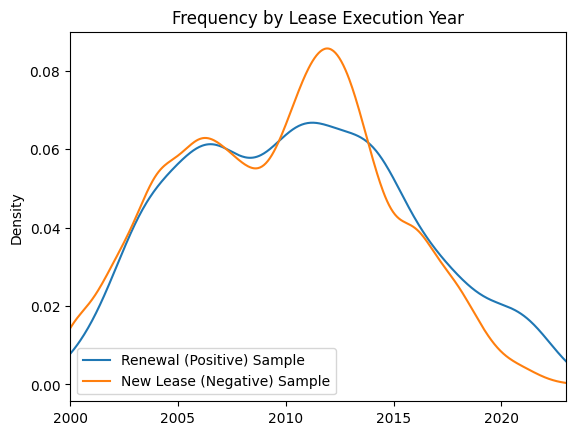

In [75]:
# create a new data set with positive and negative set combined. The positive set gets label=1, the negative set label=0
df_pred = pd.DataFrame()
df_pred = pd.concat([df_pred, df_match], axis=0)
df_pred["label"] = 1
df_pred = pd.concat([df_pred, df_nomatch], axis=0)
df_pred["label"] = df_pred["label"].fillna(0)

# define execution year 
df_pred["execution_year"] = df_pred["execution_date_monthend"].apply(lambda x: x.year)

# plot kernel density estimate (frequency) of lease execution year
df_pred[df_pred["label"] == 1]["execution_year"].plot.kde(label="Renewal (Positive) Sample")
df_pred[df_pred["label"] == 0]["execution_year"].plot.kde(label="New Lease (Negative) Sample")
plt.legend()
plt.title("Frequency by Lease Execution Year")
plt.xlim(df_pred["execution_year"].min(), df_pred["execution_year"].max())
plt.show()

#### $\color{red}{\text{Think-Pair-Share Task 4}}$ 

Repeat the same task for execution month instead of year. What do the curves represent? How do you explain this result?

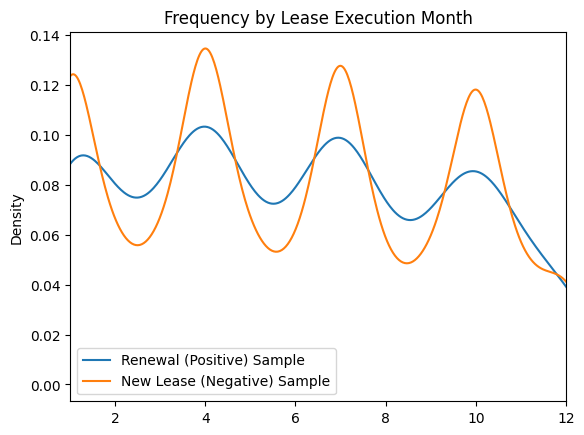

In [86]:
# create a new data set with positive and negative set combined. The positive set gets label=1, the negative set label=0
df_pred = pd.DataFrame()
df_pred = pd.concat([df_pred, df_match], axis=0)
df_pred["label"] = 1
df_pred = pd.concat([df_pred, df_nomatch], axis=0)
df_pred["label"] = df_pred["label"].fillna(0)

# define execution year 
df_pred["execution_month"] = df_pred["execution_date_monthend"].apply(lambda x: x.month)

# plot kernel density estimate (frequency) of lease execution year
df_pred[df_pred["label"] == 1]["execution_month"].plot.kde(label="Renewal (Positive) Sample")
df_pred[df_pred["label"] == 0]["execution_month"].plot.kde(label="New Lease (Negative) Sample")
plt.legend()
plt.title("Frequency by Lease Execution Month")
plt.xlim(df_pred["execution_month"].min(), df_pred["execution_month"].max())
plt.show()

## 4.3 Control variables: Dingel-Neiman WFH score
We will use the Dingel-Neimann Work From Home score as a control variable in our lease renewal prediction model. Let's first remind ourselves what this variable looks like by Tenant Industry.

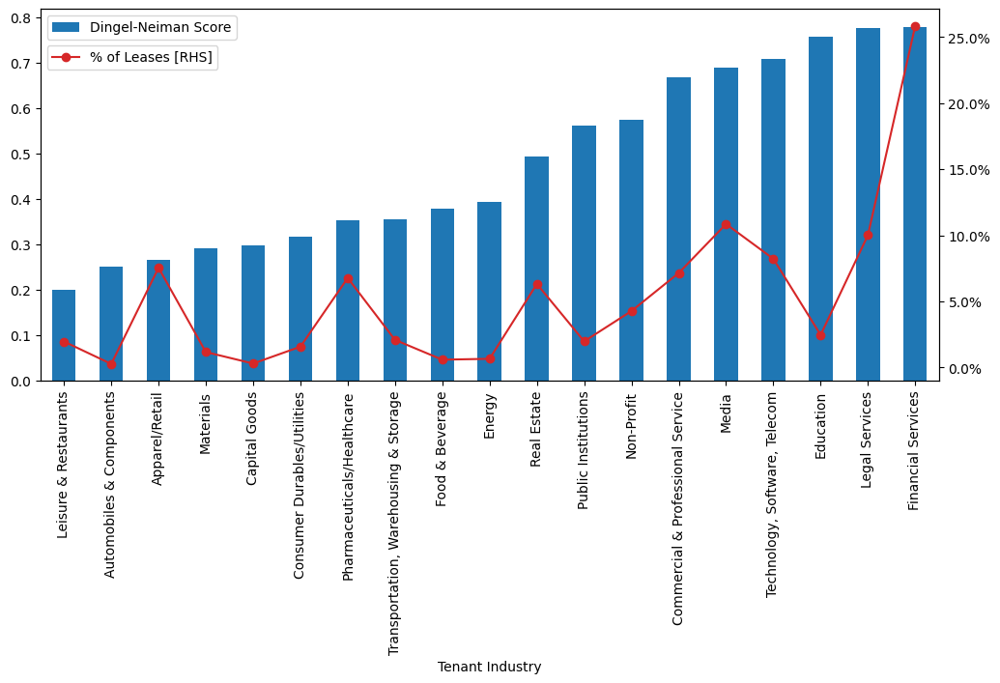

In [87]:
# The Dingel-Neiman score is the share of teleworkable employment in an industry
dingel_wfh = data.groupby(['Tenant Industry'])['teleworkable_emp3'].mean().sort_values()

# The share of leases in each industry
industries_perc = data.groupby(['Tenant Industry'])['Ones'].sum() / data['Tenant Industry'].notna().sum()
dingel_wfh = dingel_wfh.to_frame().join(industries_perc)
dingel_wfh.sort_values(by = ['teleworkable_emp3'], ascending = False)

fig, ax = plt.subplots(figsize = (12, 5))
dingel_wfh['teleworkable_emp3'].plot.bar(ax = ax)
ax_twin = ax.twinx()

(dingel_wfh['Ones'] * 100).plot(ax = ax_twin, color = 'tab:Red', marker = 'o')

ax.legend(['Dingel-Neiman Score'])
ax_twin.legend(['% of Leases [RHS]'], bbox_to_anchor=(0.0, 0., 0.205, 0.92))
ax_twin.yaxis.set_major_formatter(mticker.PercentFormatter())
plt.xticks(rotation = 80)
plt.show()

## 4.4 Linear probability model with fixed effects

We will estimate a linear probability model where the dependent variable is a binary variable for renewal (1 for the positive sample, 0 for the negative sample):
$$
Renewal = \beta_0 + \beta_1 Post + \beta_2 WFH + \beta_3 WFH \times Post + \beta_4 log(Age) + \beta_5 log(SQFT) + C(Lease Type) + C(Building Class) 
$$

Omitted cluster for categorical variables used in linear probability model:

| Variable Name | Omitted Cluster |
| --- | --- |
| Lease Type | Full Service |
| Building Class | A |
| Post | False|

In [88]:
df_match = df_match.copy(deep=True)
df_nomatch = df_nomatch.copy(deep=True)

END_YEAR = 2023 # end year for the regression

# save for homework
if SAVE_FOR_HW:
    with open(data_path +"/renewal_prediction_packet.pkl", "wb") as f:
        cPickle.dump((df_match, df_nomatch), f)

# variables to regress
categorical_variables = ['Lease Type', 'Building Class'] + ["_post"]
continuous_variables = ['log_age', 'log_sqft', "wfh", "wfh_post", "log_last_rent"] 

dfs = [df_match, df_nomatch]

# create independent variable
df_match['label'] = 1
df_nomatch['label'] = 0

# define a collector df_
df_ = pd.DataFrame()

for df in dfs:
    # define variables we need for regressions
    df.rename(columns={"teleworkable_emp3": "wfh"}, inplace=True)
    df['Year Renovated'] =  df['Year Renovated'].astype(float)
    df['renovate_flag'] = df['Year Renovated'].fillna(0.0, inplace=False)
    df['Year Renovated'] = df['Year Renovated'].fillna(0.0, inplace=False)
    df['renovate_flag'] = df['renovate_flag'].apply(lambda x: 1 if x > 0.0 else 0)
    df['built_flag'] = 1 - df['renovate_flag']
    df['last_modified_year'] = df['renovate_flag'] * df['Year Renovated'] + df['Year Built'] * df['built_flag']
    df['age'] = df['execution_date_monthend'].apply(lambda x: x.year) - df['last_modified_year']
    df['log_age'] = df['age'].apply(lambda x: 0 if x < 1 else np.log(1 + x))
    df['commencement_year'] = df['commencement_date_monthend'].apply(lambda x: x.year)
    df['expiration_year'] = df['Expiration_date_monthend'].apply(lambda x: x.year)
    df['execution_year'] = df['execution_date_monthend'].apply(lambda x: x.year)
    df['log_ner'] = df['Net Effective Rent deflated (USD) (per year)'].apply(lambda x: np.log(1 + x))
    df['log_sqft'] = df['Transaction SQFT'].apply(lambda x: np.log(x + 1))
    df["log_last_rent"] = df["last_rent"].apply(lambda x: np.log(x + 1))
    df['_post'] = df['Expiration_date_monthend'].apply(lambda x: (x.year == 2020 and x.month >= 3) or (x.year >= 2021))
    df['wfh_post'] = df['wfh'] * df['_post']
    
    # this is used for the second regression plotting
    # df["QtrFE"] = df["Expiration_date_monthend"].apply(lambda x: '0' if (x.year < 2016 and (x.year == 2016 and x.month <= 3)) else "{}Q{}".format(x.year, (x.month - 1) // 3 + 1))
    df["QtrFE"] = df["Expiration_date_monthend"].apply(lambda x: '0' if (x.year <=2016) else "{}Q{}".format(x.year, (x.month - 1) // 3 + 1))
    
    # vertically append the df_match and df_nomatch
    df_ = pd.concat([df_, df], axis=0)

# drop na for regression estimation
df_.dropna(subset=(categorical_variables + continuous_variables), inplace=True)

# define our horizon
df_ = df_[(df_['expiration_year'] <= END_YEAR)]
df_ = df_[(df_['expiration_year'] > 2003)]

# copy this for prediction in the future
df_old = df_.copy(deep=True)

# get rid of the spaces in variable names
df = df_.copy(deep=True)
for var in categorical_variables + continuous_variables:
    df.rename(columns={var: ''.join(var.split(' '))}, inplace=True)
    df_old.rename(columns={var: ''.join(var.split(' '))}, inplace=True)

# drop na again
df.dropna(subset=[''.join(var.split(' ')) for var in categorical_variables + continuous_variables], inplace=True)

print(df.__len__())

df['intercept'] = 1.0
cat_form = ' + '.join(['C({})'.format(''.join(var.split(' '))) for var in categorical_variables])
con_form = ' + '.join([''.join(var.split(' ')) for var in continuous_variables])

# define our regression formula, +1 means have intercept
formula_reg = 'label ~ {} + {} +1'.format(cat_form, con_form)

model = smf.ols(formula=formula_reg, data=df)
results = model.fit()

print(results.summary())

9225
                            OLS Regression Results                            
Dep. Variable:                  label   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     7.156
Date:                Tue, 20 Feb 2024   Prob (F-statistic):           5.40e-15
Time:                        11:11:28   Log-Likelihood:                -1818.0
No. Observations:                9225   AIC:                             3666.
Df Residuals:                    9210   BIC:                             3773.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Inter

Interpretation:
- R2 is super low 1%. So this is not predicting much
- C(post) means that post pandemic the leases after march 2020 are 3.5% less likely to be renewed 
- older buildings less likely to be renewed
- wfh has a positive impact on renewal pre-covid. 
- wfh after pandemic is wfh + wfh_post 
- wfh_post is the change in wfh from pandemic 

In [89]:
formula_reg

'label ~ C(LeaseType) + C(BuildingClass) + C(_post) + log_age + log_sqft + wfh + wfh_post + log_last_rent +1'

In [91]:
# now we want to explore quarter Fixed Effects from 2017 onwards to see how lease renewal probabilities evolved before and during the pandemic
# We drop _post dummy but replace it with QtrFE dummy
categorical_variables_ = [_ for _ in categorical_variables if _ != "_post"] + ["QtrFE"]

df_ = df_[(df_['expiration_year'] <= END_YEAR)]
df_ = df_[(df_['expiration_year'] > 2003)]
df_old = df_.copy(deep=True)
df = df_.copy(deep=True)
for var in categorical_variables_ + continuous_variables:
    df.rename(columns={var: ''.join(var.split(' '))}, inplace=True)
    df_old.rename(columns={var: ''.join(var.split(' '))}, inplace=True)

# dropna for regression
df.dropna(subset=[''.join(var.split(' ')) for var in categorical_variables_ + continuous_variables], inplace=True)
df['intercept'] = 1.0
# specify regression formula (var1 + var2 + var3 + ... + varn)
cat_form = ' + '.join(['C({})'.format(''.join(var.split(' '))) for var in categorical_variables_])
con_form = ' + '.join([''.join(var.split(' ')) for var in continuous_variables])

df.loc[df['QtrFE'].apply(lambda x: int(x[:4]) < 2017), 'QtrFE'] = '0'
formula_reg_fe = 'label ~ {} + {} +1'.format(cat_form, con_form)
# formula_reg_fe = 'label ~ {} + 1'.format(cat_form)

# no need to print out, just fit
model = smf.ols(formula=formula_reg_fe, data=df)
results_fe = model.fit()
results_fe.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  label   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     3.763
Date:                Tue, 20 Feb 2024   Prob (F-statistic):           7.03e-15
Time:                        11:37:20   Log-Likelihood:                -1791.1
No. Observations:                9225   AIC:                             3666.
Df Residuals:                    9183   BIC:                             3966.
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                          -0.0942      0.048     -1.944      0.052      -0.189       0.001
C(LeaseType)[T.Gross]              -0.0175      0.042     -0.414      0.679      -0.100       0.065
C(LeaseType)[T.Modified Gross]      0.0307      0.008      3.731      0.000       0.015       0.047
C(LeaseType)[T.NN]                 -0.0496      0.121     -0.410      0.682      -0.287       0.187
C(LeaseType)[T.NNN]                 0.0511      0.074      0.690      0.490      -0.094       0.196
C(LeaseType)[T.Net]                 0.0490      0.037      1.323      0.186      -0.024       0.122
C(LeaseType)[T.Net of Electric]    -0.0062      0.010     -0.611      0.541      -0.026       0.014
C(BuildingClass)[T.B]              -0.0177      0.007     -2.409      0.016      -0.032      -0.003
C(BuildingClass)[T.C]              -0.0311      0.016     -1.927      0.054      -0.063       0.001
C(QtrFE)[T.2017Q1]                 -0.0368      0.020     -1.860      0.063      -0.076       0.002
C(QtrFE)[T.2017Q2]                 -0.0067      0.022     -0.309      0.758      -0.049       0.036
C(QtrFE)[T.2017Q3]                 -0.0077      0.020     -0.386      0.700      -0.047       0.032
C(QtrFE)[T.2017Q4]                 -0.0665      0.024     -2.794      0.005      -0.113      -0.020
C(QtrFE)[T.2018Q1]                 -0.0683      0.020     -3.412      0.001      -0.108      -0.029
C(QtrFE)[T.2018Q2]                 -0.0401      0.021     -1.882      0.060      -0.082       0.002
C(QtrFE)[T.2018Q3]                 -0.0440      0.023     -1.954      0.051      -0.088       0.000
C(QtrFE)[T.2018Q4]                  0.0246      0.025      0.993      0.321      -0.024       0.073
C(QtrFE)[T.2019Q1]                 -0.0585      0.024     -2.454      0.014      -0.105      -0.012
C(QtrFE)[T.2019Q2]                  0.0037      0.025      0.150      0.881      -0.045       0.053
C(QtrFE)[T.2019Q3]                 -0.0370      0.022     -1.662      0.097      -0.081       0.007
C(QtrFE)[T.2019Q4]                 -0.0397      0.024     -1.648      0.099      -0.087       0.008
C(QtrFE)[T.2020Q1]                 -0.0540      0.023     -2.322      0.020      -0.100      -0.008
C(QtrFE)[T.2020Q2]                 -0.0268      0.028     -0.942      0.346      -0.083       0.029
C(QtrFE)[T.2020Q3]                 -0.0148      0.028     -0.537      0.591      -0.069       0.039
C(QtrFE)[T.2020Q4]                 -0.0415      0.029     -1.440      0.150      -0.098       0.015
C(QtrFE)[T.2021Q1]                 -0.0708      0.027     -2.661      0.008      -0.123      -0.019
C(QtrFE)[T.2021Q2]                 -0.0212      0.027     -0.793      0.428      -0.073       0.031
C(QtrFE)[T.2021Q3]                 -0.0624      0.027     -2.305      0.021      -0

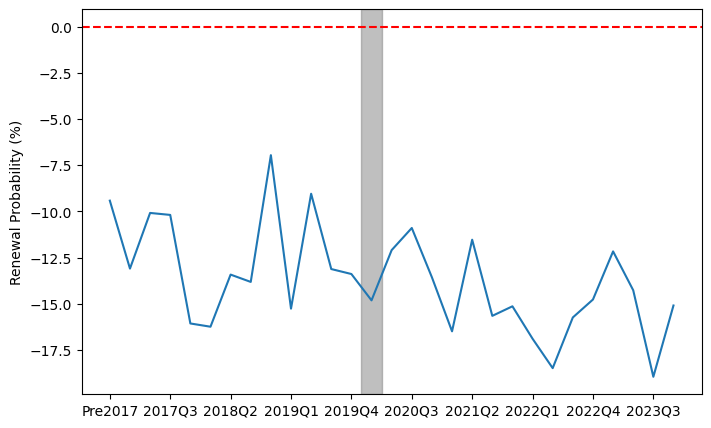

In [92]:
# plotting the FEs in a time-series manner
y = [100 * results_fe.params["Intercept"] + 100 * results_fe.params["C(QtrFE)[T.{}Q{}]".format(year, qtr)] for year in list(range(2017, END_YEAR + 1))  for qtr in [1,2,3,4]]
y = [100 * results_fe.params["Intercept"]] + y

xticks = ["Pre2017"] + ["{}Q{}".format(year, qtr) for year in list(range(2017, END_YEAR + 1))  for qtr in [1,2,3,4]]

# plot the time series of the FEs
# NOTE: We care about the relative change in the renewal probability, as we haven't included the average effect of other variables
# Covid and WFH leads to a drop in the renewal probability
f, a = plt.subplots(1,1,figsize=(8, 5))
plt.plot(y)

# define ticks and COVID recession
plt.xticks([_ for _ in range(len(xticks)) if _ % 3 == 0], [xticks[_] for _ in range(len(xticks)) if _ % 3 == 0])
plt.axvspan(12.5, 13.5, alpha=0.5, color="grey", ec="grey", fc="grey")
plt.axhline(0, ls='--', color='r')
plt.ylabel("Renewal Probability (%)")
plt.show()

## 4.5 Evaluation of a predictive classifier: confusion matrix and F-1 score

For binary predictive classifiers (such as renew or not), a commonly used diagnostic is the **confusion matrix**. The `(i, j)` element means the actual label is `i` and the predicted label is `j`. The diagonals are correct predictions.

| True Negative | False Negative     |
| ----:   |          ---: |
| False Positive        | True Positive      |

The F1 score is the **harmonic mean** of `precision` and `recall`. 

$$\text{Precision} = \frac{tp}{tp+fp}$$

$$\text{Recall}=\frac{tp}{tp+fn}$$

$$\text{F-1}=\frac{2tp}{2tp+fp+fn}$$

In [ ]:
# change the data format to a dictionary in order to get y_hat
dic = {''.join(var.split(' ')): df_old[''.join(var.split(' '))].to_list() for var in categorical_variables + continuous_variables}
pred = results.predict(exog=dic)

# define a set of collectors to optimize F1 score
f1_list = []
precision = []
recall = []

# grid search
theta_list = [_ for _ in np.arange(0.0, 1.0, 0.01)]

# find the best probability cutoff theta above which to classify a prediction as a renewal
for theta in theta_list:
    # get the predicted label
    pred_ = [1 if _ > theta else 0 for _ in pred]
    
    # calculate the confusion matrix
    conf_mat = confusion_matrix(df_old['label'].to_list(), pred_)
    
    # append the outcomes
    f1_list.append(f1_score(df_old['label'].to_list(), pred_))
    precision.append(conf_mat[(1, 1)] / (1 + conf_mat[(1, 0)] + conf_mat[(1, 1)]))
    recall.append(conf_mat[(1, 1)] / (1 + conf_mat[(0, 1)] + conf_mat[(1, 1)]))

# define this dictionary again and predict
dic = {''.join(var.split(' ')): df_old[''.join(var.split(' '))].to_list() for var in categorical_variables + continuous_variables}
pred = results.predict(exog=dic)

# choose the optimal theta that maximizes the F1 score
pred_ = [1 if _ > theta_list[f1_list.index(max(f1_list))] else 0 for _ in pred]

# get optimal confusion matrix
conf_mat = confusion_matrix(df_old['label'].to_list(), pred_)

print(conf_mat)
print("Optimal theta: ", theta_list[f1_list.index(max(f1_list))])
print("Maximum F1 score: ", max(f1_list))
print("Precision: ", conf_mat[(1, 1)] / (conf_mat[(1, 0)] + conf_mat[(1,1)]))
print("Recall: ", conf_mat[(1,1)] / (conf_mat[(0,1)] + conf_mat[(1, 1)]))

[[4449 3879]
 [ 340  557]]
Optimal theta:  0.1
Maximum F1 score:  0.20888805550346895
Precision:  0.620958751393534
Recall:  0.12556357078449054


## 4.6 Predicting Renewal Quantity (sqft)

In [ ]:
# First inspect the correlation between the old lease and the renewed lease
np.log(df_compare[['trans_sqft_new', 'Transaction SQFT']]).corr()

,trans_sqft_new,Transaction SQFT
trans_sqft_new,1.00000,0.93414
Transaction SQFT,0.93414,1.00000


In [ ]:
df_compare['log_sqft_new'] = np.log(df_compare['trans_sqft_new'])
df_compare['log_sqft'] = np.log(df_compare['Transaction SQFT'])
df_compare['term'] = df_compare['Expiration_date_monthend'].apply(lambda x: 12 * x.year + x.month) - df_compare['commencement_date_monthend'].apply(lambda x: 12 * x.year + x.month)
df_compare['log_term'] = np.log(df_compare['term'])
df_compare['_post'] = df_compare['execution_new'].apply(lambda x: (x.year == 2020 and x.month >= 3) or (x.year >= 2021))

df_compare = pd.merge(df_compare, data[['Building Code', "Building Class"]].drop_duplicates(), on=['Building Code'])
df_compare = pd.merge(df_compare, data[['lease_code', 'Lease Type']], on=['lease_code'])

df_compare['BuildingClass'] = df_compare['Building Class']
df_compare['LeaseType'] = df_compare['Lease Type']

# Regress the log of the new sqft on the log of the old sqft, the log of the term, and the dummies
model = smf.ols(formula='log_sqft_new ~ log_sqft + log_term + C(BuildingClass) + C(LeaseType) + C(_post) + 1', data=df_compare)
results = model.fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:           log_sqft_new   R-squared:                       0.889
Model:                            OLS   Adj. R-squared:                  0.888
Method:                 Least Squares   F-statistic:                     843.5
Date:                Mon, 12 Feb 2024   Prob (F-statistic):               0.00
Time:                        21:51:35   Log-Likelihood:                -581.04
No. Observations:                1062   AIC:                             1184.
Df Residuals:                    1051   BIC:                             1239.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 